# Few-shot Learning on category recoginition on fashion appereal

## Import Libraries

In [30]:

import os
import gc
import json
import json
import warnings
import random
from typing import Dict, List, Optional, Tuple

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import cv2
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import DataLoader, Dataset , TensorDataset
import torchvision.transforms as transforms
import torchvision.models as models
from sklearn.metrics import precision_recall_fscore_support,  confusion_matrix

from tqdm import tqdm
tqdm.pandas()

def set_seed(seed=42):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    torch.backends.cudnn.deterministic = True

set_seed(42)

warnings.filterwarnings('ignore')

print(f"PyTorch version: {torch.__version__}")
print(f"CUDA available: {torch.cuda.is_available()}")
if torch.cuda.is_available():
    print(f"CUDA device: {torch.cuda.get_device_name(0)}")
    print(f"CUDA memory: {torch.cuda.get_device_properties(0).total_memory / 1e9:.2f} GB")

PyTorch version: 2.8.0+cu128
CUDA available: True
CUDA device: NVIDIA GeForce GTX 1650
CUDA memory: 4.09 GB


## Define dataset

In [12]:
dataset_path = ''
ROOT_DIR = "/home/vishn/Documents/5/ML/Code/Project/output1/"

ORIGINAL_TRAIN = os.path.join(dataset_path, "DeepFashion2/deepfashion2_original_images/train")
ORIGINAL_VALIDATION = os.path.join(dataset_path, "DeepFashion2/deepfashion2_original_images/validation")
ORIGINAL_TEST = os.path.join(dataset_path, "DeepFashion2/deepfashion2_original_images/test/test/image")

TRAIN_DATAFRAMES = os.path.join(dataset_path, "DeepFashion2/img_info_dataframes/train.csv")
VALIDATION_DATAFRAMES = os.path.join(dataset_path, "DeepFashion2/img_info_dataframes/validation.csv")
TEST_DATAFRAMES = os.path.join(dataset_path, "DeepFashion2/img_info_dataframes/test.csv")

## Dataset Description

### Dataset Tree

In [3]:
def dataset_tree(dataset_path):
  exception_dirs = {"json_for_validation", "json_for_test", "json_for_train"}

  for root, dirs, files in os.walk(dataset_path):
      level = root.replace(dataset_path, "").count(os.sep)
      indent = " " * 2 * level
      folder_name = os.path.basename(root)
      print(f"{indent}{folder_name}/")

      if not files:
          continue  # skip empty folders

      # Check if this folder is an exception
      if folder_name in exception_dirs:
          for f in sorted(files):
              if f.lower().endswith(".json"):
                  print(f"{indent}  {f}")
          continue

      # Normal logic
      jpg_json_files = [f for f in files if f.lower().endswith((".jpg", ".json"))]
      other_files = [f for f in files if not f.lower().endswith((".jpg", ".json"))]

      if other_files:
          # Show ALL files if non-jpg/json present
          for f in sorted(files):
              print(f"{indent}  {f}")
      else:
          # Only jpg/json → show first & last
          jpgs = sorted([f for f in jpg_json_files if f.lower().endswith(".jpg")])
          jsons = sorted([f for f in jpg_json_files if f.lower().endswith(".json")])

          if jpgs:
              print(f"{indent}  [.jpg]")
              print(f"{indent}    ↳ First: {jpgs[0]}")
              print(f"{indent}    ↳ Last:  {jpgs[-1]}")

          if jsons:
              print(f"{indent}  [.json]")
              print(f"{indent}    ↳ First: {jsons[0]}")
              print(f"{indent}    ↳ Last:  {jsons[-1]}")
dataset_tree(dataset_path+"DeepFashion2")

DeepFashion2/
  deepfashion2_original_images/
    train/
      image/
        [.jpg]
          ↳ First: 000001.jpg
          ↳ Last:  191961.jpg
      annos/
        [.json]
          ↳ First: 000001.json
          ↳ Last:  191961.json
    validation/
      image/
        [.jpg]
          ↳ First: 000001.jpg
          ↳ Last:  032153.jpg
      annos/
        [.json]
          ↳ First: 000001.json
          ↳ Last:  032153.json
      json_for_validation/
        keypoints_val_information.json
        keypoints_val_vis.json
        keypoints_val_vis_and_occ.json
        retrieval_val_consumer_information.json
        retrieval_val_shop_information.json
        val_gallery.json
        val_query.json
    test/
      json_for_test/
        keypoints_test_information.json
        retrieval_test_consumer_information.json
        retrieval_test_shop_information.json
      test/
        image/
          [.jpg]
            ↳ First: 000001.jpg
            ↳ Last:  062629.jpg
  img_info_dataframe

### Read Using Pandas

In [4]:
train_df=pd.read_csv(TRAIN_DATAFRAMES)
validation_df=pd.read_csv(VALIDATION_DATAFRAMES)
test_df=pd.read_csv(TEST_DATAFRAMES)

### Display

In [5]:
display(train_df)
print("\n\n\n")
display(validation_df)
print("\n\n\n")
display(test_df)

,path,segmentation,landmarks,b_box,category_id,category_name,scale,viewpoint,occlusion,zoom_in,img_height,img_width
0,/kaggle/input/deepfashion2-original-with-dataf...,"[[360, 172, 364, 166, 371, 163, 325, 168, 299,...","[387, 176, 1, 371, 163, 1, 364, 166, 1, 360, 1...","[227, 155, 442, 381]",4,long sleeve outwear,2,2,2,1,640,640
1,/kaggle/input/deepfashion2-original-with-dataf...,"[[381, 306, 334, 289, 297, 266, 261, 350, 225,...","[297, 266, 1, 334, 289, 1, 381, 306, 1, 261, 3...","[209, 263, 387, 539]",8,trousers,2,2,2,1,640,640
2,/kaggle/input/deepfashion2-original-with-dataf...,"[[320, 33, 309, 86, 247, 102, 183, 78, 172, 27...","[241, 45, 2, 172, 27, 2, 183, 78, 2, 247, 102,...","[6, 17, 460, 341]",1,short sleeve top,3,1,1,1,631,468
3,/kaggle/input/deepfashion2-original-with-dataf...,"[[150, 285, 249, 302, 350, 270, 464, 396, 464,...","[150, 285, 2, 249, 302, 2, 350, 270, 2, 0, 0, ...","[0, 263, 465, 630]",9,skirt,3,1,1,3,631,468
4,/kaggle/input/deepfashion2-original-with-dataf...,"[[351, 246, 353, 277, 325, 297, 279, 302, 242,...","[298, 270, 1, 242, 287, 2, 279, 302, 2, 325, 2...","[178, 182, 695, 800]",10,short sleeve dress,3,2,2,1,926,750
...,...,...,...,...,...,...,...,...,...,...,...,...
312181,/kaggle/input/deepfashion2-original-with-dataf...,"[[471, 456, 436, 503, 386, 553, 338, 519, 314,...","[388, 456, 1, 314, 458, 1, 338, 519, 1, 386, 5...","[112, 448, 711, 1039]",2,long sleeve top,2,2,2,1,1141,800
312182,/kaggle/input/deepfashion2-original-with-dataf...,"[[528, 863, 410, 868, 299, 861, 296, 1003, 320...","[299, 861, 1, 410, 868, 1, 528, 863, 1, 296, 1...","[286, 855, 542, 1140]",8,trousers,1,2,2,3,1141,800
312183,/kaggle/input/deepfashion2-original-with-dataf...,"[[214.0, 269.0, 226.0, 297.0, 248.0, 357.0, 25...","[304, 301, 1, 256, 320, 2, 281, 318, 2, 308, 3...","[191, 168, 495, 783]",13,sling dress,2,2,1,1,960,640
312184,/kaggle/input/deepfashion2-original-with-dataf...,"[[212.94, 211.43, 219.97, 202.76, 235.84, 192....","[274, 194, 1, 234, 202, 2, 254, 237, 2, 290, 2...","[155, 164, 452, 440]",1,short sleeve top,2,2,2,1,960,640


,path,segmentation,landmarks,b_box,category_id,category_name,scale,viewpoint,occlusion,zoom_in,img_height,img_width
0,/kaggle/input/deepfashion2-original-with-dataf...,"[[122.15094339622641, 5.886792452830188, 123.6...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[32, 2, 467, 357]",2,long sleeve top,3,2,2,2,702,468
1,/kaggle/input/deepfashion2-original-with-dataf...,"[[153.70105263157896, 88.67368421052632, 164.2...","[154, 91, 1, 274, 100, 1, 406, 127, 1, 79, 270...","[1, 79, 467, 587]",9,skirt,3,2,2,2,702,468
2,/kaggle/input/deepfashion2-original-with-dataf...,"[[307.4285714285714, 597.1770451770451, 354.53...","[305, 597, 1, 444, 601, 1, 626, 589, 1, 288, 7...","[274, 580, 666, 879]",8,trousers,2,2,2,3,880,880
3,/kaggle/input/deepfashion2-original-with-dataf...,"[[335.16483516483515, 57.16239316239315, 345.3...","[430, 46, 1, 336, 63, 2, 378, 82, 1, 443, 88, ...","[213, 26, 712, 656]",2,long sleeve top,3,2,2,1,880,880
4,/kaggle/input/deepfashion2-original-with-dataf...,"[[248.34904264710372, 632.7944963623632, 253.0...","[251, 629, 1, 358, 618, 1, 449, 591, 1, 255, 7...","[236, 583, 543, 892]",8,trousers,2,2,2,3,912,750
...,...,...,...,...,...,...,...,...,...,...,...,...
52485,/kaggle/input/deepfashion2-original-with-dataf...,"[[155.65306122448987, 584.0596546310832, 158.2...","[334, 291, 1, 277, 289, 2, 306, 304, 2, 340, 3...","[128, 275, 541, 795]",2,long sleeve top,2,2,1,1,960,640
52486,/kaggle/input/deepfashion2-original-with-dataf...,"[[159.6247146792601, 460.1382133018498, 164.39...","[165, 454, 1, 284, 452, 1, 411, 449, 1, 173, 5...","[161, 446, 417, 623]",8,trousers,2,2,2,2,624,468
52487,/kaggle/input/deepfashion2-original-with-dataf...,"[[22.895972714155036, 112.48107044470696, 12.6...","[259, 15, 1, 151, 12, 2, 200, 80, 2, 279, 113,...","[2, 8, 466, 554]",5,vest,3,2,1,2,624,468
52488,/kaggle/input/deepfashion2-original-with-dataf...,"[[162.26349206346143, 614.9777777777668, 192.4...","[162, 615, 1, 230, 609, 1, 289, 607, 1, 156, 6...","[147, 601, 295, 701]",8,trousers,1,2,2,2,702,468


,path,img_height,img_width
0,/kaggle/input/deepfashion2-original-with-dataf...,702,468
1,/kaggle/input/deepfashion2-original-with-dataf...,702,468
2,/kaggle/input/deepfashion2-original-with-dataf...,708,706
3,/kaggle/input/deepfashion2-original-with-dataf...,648,750
4,/kaggle/input/deepfashion2-original-with-dataf...,493,790
...,...,...,...
62624,/kaggle/input/deepfashion2-original-with-dataf...,624,468
62625,/kaggle/input/deepfashion2-original-with-dataf...,624,468
62626,/kaggle/input/deepfashion2-original-with-dataf...,833,468
62627,/kaggle/input/deepfashion2-original-with-dataf...,632,468


## Replace '' to ""

### Segmentation parsing

In [6]:
validation_df['segmentation'] = validation_df['segmentation'].progress_apply(lambda x: json.loads(x.replace("'", "\"")))
train_df['segmentation'] = train_df['segmentation'].progress_apply(lambda x: json.loads(x.replace("'", "\"")))

100%|██████████| 312186/312186 [00:04<00:00, 62567.52it/s]


### Bounding Box parsing

In [7]:
validation_df['b_box'] = validation_df['b_box'].progress_apply(lambda x: json.loads(x.replace("'", "\"")))
train_df['b_box'] = train_df['b_box'].progress_apply(lambda x: json.loads(x.replace("'", "\"")))

100%|██████████| 312186/312186 [00:01<00:00, 246697.36it/s]


### Landmarks Parsing

In [8]:
validation_df['landmarks'] = validation_df['landmarks'].progress_apply(lambda x: json.loads(x.replace("'", "\"")))
train_df['landmarks'] = train_df['landmarks'].progress_apply(lambda x: json.loads(x.replace("'", "\"")))

100%|██████████| 312186/312186 [00:02<00:00, 120837.45it/s]


### EDA (Before Resizing)

### Distribution of Image Dimensions Across Datasets

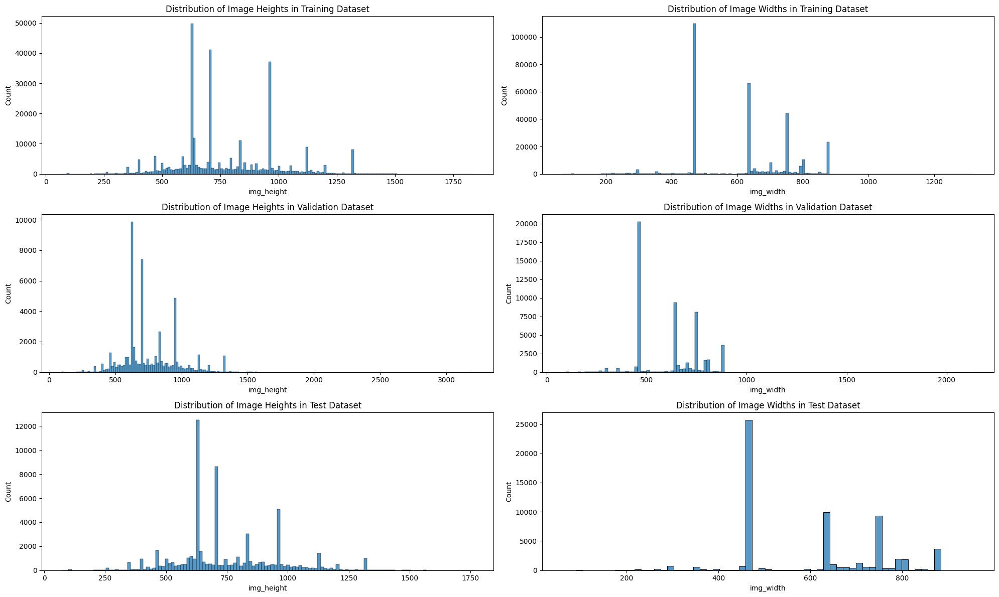

In [9]:
fig, ax = plt.subplots(3, 2, figsize=(20,12))
sns.histplot(train_df['img_height'], ax=ax[0, 0]).set_title('Distribution of Image Heights in Training Dataset')
sns.histplot(train_df['img_width'], ax=ax[0, 1]).set_title('Distribution of Image Widths in Training Dataset')

sns.histplot(validation_df['img_height'], ax=ax[1, 0]).set_title('Distribution of Image Heights in Validation Dataset')
sns.histplot(validation_df['img_width'], ax=ax[1, 1]).set_title('Distribution of Image Widths in Validation Dataset')

sns.histplot(test_df['img_height'], ax=ax[2, 0]).set_title('Distribution of Image Heights in Test Dataset')
sns.histplot(test_df['img_width'], ax=ax[2, 1]).set_title('Distribution of Image Widths in Test Dataset')

plt.tight_layout()
plt.show()

### Maximum Image Dimensions in Datasets

In [10]:
print("Maximum height found in the training dataset is : {}".format(train_df.img_height.max()))
print("Maximum height found in the validation dataset is : {}".format(validation_df.img_height.max()))
print("Maximum height found in the test dataset is : {}".format(test_df.img_height.max()))

print("\nMaximum width found in the training dataset is : {}".format(train_df.img_width.max()))
print("Maximum height found in the validation dataset is : {}".format(validation_df.img_width.max()))
print("Maximum height found in the test dataset is : {}".format(test_df.img_width.max()))

Maximum height found in the training dataset is : 1835
Maximum height found in the validation dataset is : 3201
Maximum height found in the test dataset is : 1760

Maximum width found in the training dataset is : 1320
Maximum height found in the validation dataset is : 2134
Maximum height found in the test dataset is : 955


## Resizing the Images and Annotations

### Directory Setup and Target Image Size Configuration

In [13]:
RESIZED_TARGET_DIRECTORY = ROOT_DIR + "resized/"
TARGET_DIR = ROOT_DIR + "input/"
TARGET_SIZE = (224, 224)
os.makedirs(os.path.join(RESIZED_TARGET_DIRECTORY, "train"))
os.makedirs(os.path.join(RESIZED_TARGET_DIRECTORY, "validation"))
os.makedirs(os.path.join(RESIZED_TARGET_DIRECTORY, "test"))
os.makedirs(TARGET_DIR)

### Image and Annotation Resizing Functions

In [14]:
def resize_bbox(bbox, x_scale, y_scale):
    return [bbox[0] * x_scale,
            bbox[1] * y_scale,
            bbox[2] * x_scale,
            bbox[3] * y_scale]

def resize_segmentation(segmentation, x_scale, y_scale):
    resized_segmentation = []
    for polygon in segmentation:
        resized_polygon = []
        for i in range(0, len(polygon), 2):
            x = polygon[i] * x_scale
            y = polygon[i + 1] * y_scale
            resized_polygon.extend([x, y])
        resized_segmentation.append(resized_polygon)

    return resized_segmentation

def resize_image_and_annotations(row):
    # Creating path for the resized image
    img_path_original = row['path']
    name_list = img_path_original.split(os.sep)
    df_type = name_list[-3]
    image_filename = name_list[-1]

    # Construct the correct original image path
    if df_type == "test":
        img_path = os.path.join(ORIGINAL_TEST, image_filename)
    else:
         img_path = os.path.join(dataset_path, "DeepFashion2/deepfashion2_original_images", df_type, "image", image_filename)


    new_img_path = os.path.join(RESIZED_TARGET_DIRECTORY, df_type, image_filename)

    # Reading & resizing the image; saving resized image into new folder
    image = cv2.imread(img_path)

    # Check if image is loaded successfully
    if image is None:
        print(f"Warning: Could not load image at {img_path}")
        # Return the original row or handle this case as needed
        return row

    original_height, original_width = image.shape[:2]
    resized_image = cv2.resize(image, TARGET_SIZE, interpolation=cv2.INTER_AREA)
    cv2.imwrite(new_img_path, resized_image)

    if df_type == "test":
        # Update the dataframe row
        row['path'] = new_img_path
        row['img_height'] = TARGET_SIZE[1]
        row['img_width'] = TARGET_SIZE[0]
    else:
        bbox = row['b_box']
        segmentation = row['segmentation']

        # Calculate the scaling factors
        x_scale = TARGET_SIZE[0] / original_width
        y_scale = TARGET_SIZE[1] / original_height

        # Resize the bounding box
        resized_bbox = resize_bbox(bbox, x_scale, y_scale)

        # Resize the segmentation
        resized_segmentation = resize_segmentation(segmentation, x_scale, y_scale)

        # Update the dataframe row
        row['path'] = new_img_path
        row['b_box'] = resized_bbox
        row['segmentation'] = resized_segmentation
        row['img_height'] = TARGET_SIZE[1]
        row['img_width'] = TARGET_SIZE[0]

    return row

### Resizing Images and Updating Annotations in DataFrames

In [15]:
train_df_resized = train_df.progress_apply(resize_image_and_annotations, axis=1)
validation_df_resized = validation_df.progress_apply(resize_image_and_annotations, axis=1)
test_df_resized = test_df.progress_apply(resize_image_and_annotations, axis=1)

100%|██████████| 62629/62629 [04:46<00:00, 218.78it/s]


### Saving Resized DataFrames to CSV

In [16]:
train_df_resized.to_csv(TARGET_DIR + "train.csv", index=False)
validation_df_resized.to_csv(TARGET_DIR + "validation.csv", index=False)
test_df_resized.to_csv(TARGET_DIR + "test.csv", index=False)

## Advanced Preprocessing Pipeline

### Define Normalization Constants (ImageNet Standards)

In [17]:
# ImageNet statistics for normalization
IMAGENET_MEAN = [0.485, 0.456, 0.406]
IMAGENET_STD = [0.229, 0.224, 0.225]

print(f"ImageNet Mean: {IMAGENET_MEAN}")
print(f"ImageNet Std: {IMAGENET_STD}")

ImageNet Mean: [0.485, 0.456, 0.406]
ImageNet Std: [0.229, 0.224, 0.225]


### Create Transform Pipelines 

In [44]:
def get_train_transforms(img_size: Tuple[int, int] = (224, 224)) -> transforms.Compose:
    """
    Create training data augmentation pipeline with:
    - Random resized crop
    - Random horizontal flip
    - Random rotation
    - Color jitter
    - Normalization with ImageNet statistics
    
    Args:
        img_size: Target image size (height, width)
    
    Returns:
        transforms.Compose: Composed transform pipeline
    """
    train_transform = transforms.Compose([
        transforms.ToPILImage(),  # Convert numpy/tensor to PIL
        transforms.RandomResizedCrop(
            img_size, 
            scale=(0.8, 1.0),  # Crop 80-100% of original
            ratio=(0.9, 1.1)   # Aspect ratio variation
        ),
        transforms.RandomHorizontalFlip(p=0.5),  # 50% chance of horizontal flip
        transforms.RandomRotation(degrees=15),    # Rotate ±15 degrees
        transforms.ColorJitter(
            brightness=0.2,  # Brightness variation ±20%
            contrast=0.2,    # Contrast variation ±20%
            saturation=0.2,  # Saturation variation ±20%
            hue=0.1          # Hue variation ±10%
        ),
        transforms.ToTensor(),  # Convert to tensor [0, 1]
        transforms.Normalize(
            mean=IMAGENET_MEAN, 
            std=IMAGENET_STD
        )
    ])
    return train_transform


def get_val_transforms(img_size: Tuple[int, int] = (224, 224)) -> transforms.Compose:
    """
    Create validation/test data preprocessing pipeline (no augmentation):
    - Resize to fixed size
    - Convert to tensor
    - Normalization with ImageNet statistics
    
    Args:
        img_size: Target image size (height, width)
    
    Returns:
        transforms.Compose: Composed transform pipeline
    """
    val_transform = transforms.Compose([
        transforms.ToPILImage(),
        transforms.Resize(img_size),
        transforms.ToTensor(),
        transforms.Normalize(
            mean=IMAGENET_MEAN, 
            std=IMAGENET_STD
        )
    ])
    return val_transform


def get_test_transforms(img_size: Tuple[int, int] = (224, 224)) -> transforms.Compose:
    """
    Create test data preprocessing pipeline (same as validation).
    
    Args:
        img_size: Target image size (height, width)
    
    Returns:
        transforms.Compose: Composed transform pipeline
    """
    return get_val_transforms(img_size)


# Create transform instances
train_transforms = get_train_transforms(TARGET_SIZE)
val_transforms = get_val_transforms(TARGET_SIZE)
test_transforms = get_test_transforms(TARGET_SIZE)


### Custom Dataset Class

In [19]:
class FashionDataset(Dataset):
    """
    Custom PyTorch Dataset for DeepFashion2 dataset.
    Handles image loading, preprocessing, and annotation management.
    """
    
    def __init__(
        self, 
        dataframe: pd.DataFrame, 
        transform: Optional[transforms.Compose] = None,
        return_annotations: bool = True
    ):
        """
        Initialize the dataset.
        
        Args:
            dataframe: Pandas DataFrame with image paths and annotations
            transform: torchvision transforms to apply
            return_annotations: Whether to return bounding boxes and other annotations
        """
        self.df = dataframe.reset_index(drop=True)
        self.transform = transform
        self.return_annotations = return_annotations
        
    def __len__(self) -> int:
        """Return the total number of samples."""
        return len(self.df)
    
    def __getitem__(self, idx: int) -> Dict:
        """
        Get a single sample from the dataset.
        
        Args:
            idx: Index of the sample
            
        Returns:
            Dictionary containing image and annotations (if applicable)
        """
        row = self.df.iloc[idx]
        
        # Load image
        img_path = row['path']
        image = cv2.imread(img_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB
        
        # Apply transforms
        if self.transform:
            image = self.transform(image)
        
        # Extract image name from path
        img_name = os.path.basename(img_path)
        
        # Prepare output dictionary
        sample = {
            'image': image,
            'image_id': img_name,
            'image_path': img_path
        }
        
        # Add annotations if requested (for train/val sets)
        if self.return_annotations:
            if 'category_id' in row:
                sample['category_id'] = torch.tensor(row['category_id'], dtype=torch.long)
            if 'b_box' in row:
                sample['bbox'] = torch.tensor(row['b_box'], dtype=torch.float32)
            if 'style' in row:
                sample['style'] = torch.tensor(row['style'], dtype=torch.long)
            if 'segmentation' in row:
                sample['segmentation'] = row['segmentation']  # Keep as list for now
        
        return sample


### Create Dataset Instances

In [20]:
# Create dataset instances with appropriate transforms
train_dataset = FashionDataset(
    dataframe=train_df_resized,
    transform=train_transforms,
    return_annotations=True
)

val_dataset = FashionDataset(
    dataframe=validation_df_resized,
    transform=val_transforms,
    return_annotations=True
)

test_dataset = FashionDataset(
    dataframe=test_df_resized,
    transform=test_transforms,
    return_annotations=False  # Test set doesn't have annotations
)

print(f"Train dataset created: {len(train_dataset)} samples")
print(f"Validation dataset created: {len(val_dataset)} samples")
print(f"Test dataset created: {len(test_dataset)} samples")

Train dataset created: 312186 samples
Validation dataset created: 52490 samples
Test dataset created: 62629 samples


### Create DataLoaders

In [21]:
def custom_collate_fn(batch):
    """
    Custom collate function to handle variable-length segmentation data.
    
    Args:
        batch: List of samples from the dataset
        
    Returns:
        Dictionary with batched data
    """
    # Separate the segmentation data (variable length) from other data
    images = torch.stack([item['image'] for item in batch])
    image_ids = [item['image_id'] for item in batch]
    image_paths = [item['image_path'] for item in batch]
    
    collated = {
        'image': images,
        'image_id': image_ids,
        'image_path': image_paths
    }
    
    # Handle annotations if present
    if 'category_id' in batch[0]:
        collated['category_id'] = torch.stack([item['category_id'] for item in batch])
    
    if 'bbox' in batch[0]:
        collated['bbox'] = torch.stack([item['bbox'] for item in batch])
    
    if 'style' in batch[0]:
        collated['style'] = torch.stack([item['style'] for item in batch])
    
    # Keep segmentation as a list (variable length per sample)
    if 'segmentation' in batch[0]:
        collated['segmentation'] = [item['segmentation'] for item in batch]
    
    return collated


def create_dataloader(
    dataset: Dataset,
    batch_size: int = 32,
    shuffle: bool = True,
    num_workers: int = 4,
    pin_memory: bool = True
) -> DataLoader:
    """
    Create a DataLoader for the given dataset.
    
    Args:
        dataset: PyTorch Dataset instance
        batch_size: Number of samples per batch
        shuffle: Whether to shuffle the data
        num_workers: Number of parallel workers for data loading
        pin_memory: Whether to pin memory for faster GPU transfer
        
    Returns:
        DataLoader instance
    """
    dataloader = DataLoader(
        dataset,
        batch_size=batch_size,
        shuffle=shuffle,
        num_workers=num_workers,
        pin_memory=pin_memory and torch.cuda.is_available(),
        collate_fn=custom_collate_fn  
    )
    return dataloader


# Hyperparameters
BATCH_SIZE = 32
NUM_WORKERS = 4 

# Create dataloaders
train_loader = create_dataloader(
    train_dataset, 
    batch_size=BATCH_SIZE, 
    shuffle=True,
    num_workers=NUM_WORKERS
)

val_loader = create_dataloader(
    val_dataset, 
    batch_size=BATCH_SIZE, 
    shuffle=False,  # Don't shuffle validation data
    num_workers=NUM_WORKERS
)

test_loader = create_dataloader(
    test_dataset, 
    batch_size=BATCH_SIZE, 
    shuffle=False,  # Don't shuffle test data
    num_workers=NUM_WORKERS
)

print(f"Train DataLoader created: {len(train_loader)} batches")
print(f"Validation DataLoader created: {len(val_loader)} batches")
print(f"Test DataLoader created: {len(test_loader)} batches")
print(f"\nBatch size: {BATCH_SIZE}")
print(f"Number of workers: {NUM_WORKERS}")
print("\nCustom collate function handles variable-length segmentation data")

Train DataLoader created: 9756 batches
Validation DataLoader created: 1641 batches
Test DataLoader created: 1958 batches

Batch size: 32
Number of workers: 4

Custom collate function handles variable-length segmentation data


### Visualise sample batch with preprocessing

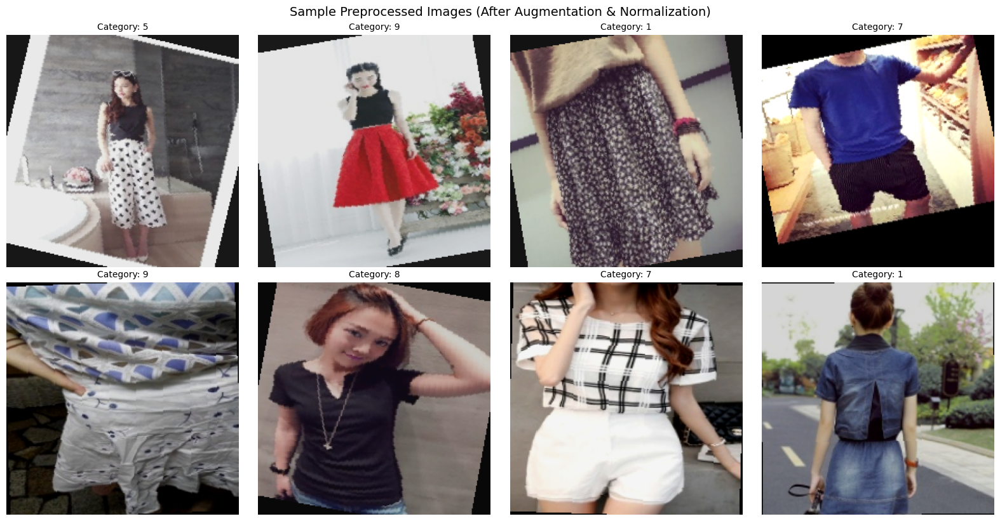

In [22]:
def denormalize_image(tensor_img: torch.Tensor, mean: List[float], std: List[float]) -> np.ndarray:
    """
    Denormalize a normalized tensor image back to [0, 1] range.
    
    Args:
        tensor_img: Normalized image tensor (C, H, W)
        mean: Mean values used for normalization
        std: Standard deviation values used for normalization
        
    Returns:
        Denormalized image as numpy array
    """
    img = tensor_img.clone()
    for t, m, s in zip(img, mean, std):
        t.mul_(s).add_(m)  # Reverse normalization: x = x * std + mean
    img = torch.clamp(img, 0, 1)  # Clamp to [0, 1]
    return img.permute(1, 2, 0).numpy()


def visualize_batch(dataloader: DataLoader, num_images: int = 8):
    """
    Visualize a batch of images from the dataloader.
    
    Args:
        dataloader: PyTorch DataLoader
        num_images: Number of images to display
    """
    # Get one batch
    batch = next(iter(dataloader))
    images = batch['image']
    
    # Plot images
    fig, axes = plt.subplots(2, 4, figsize=(16, 8))
    axes = axes.flatten()
    
    for idx in range(min(num_images, len(images))):
        img = denormalize_image(images[idx], IMAGENET_MEAN, IMAGENET_STD)
        axes[idx].imshow(img)
        axes[idx].axis('off')
        
        # Add category info if available
        if 'category_id' in batch:
            cat_id = batch['category_id'][idx].item()
            axes[idx].set_title(f"Category: {cat_id}", fontsize=10)
    
    plt.tight_layout()
    plt.suptitle("Sample Preprocessed Images (After Augmentation & Normalization)", 
                 fontsize=14, y=1.02)
    plt.show()


# Visualize training samples (with augmentation)
visualize_batch(train_loader, num_images=8)


Validation samples (without augmentation):


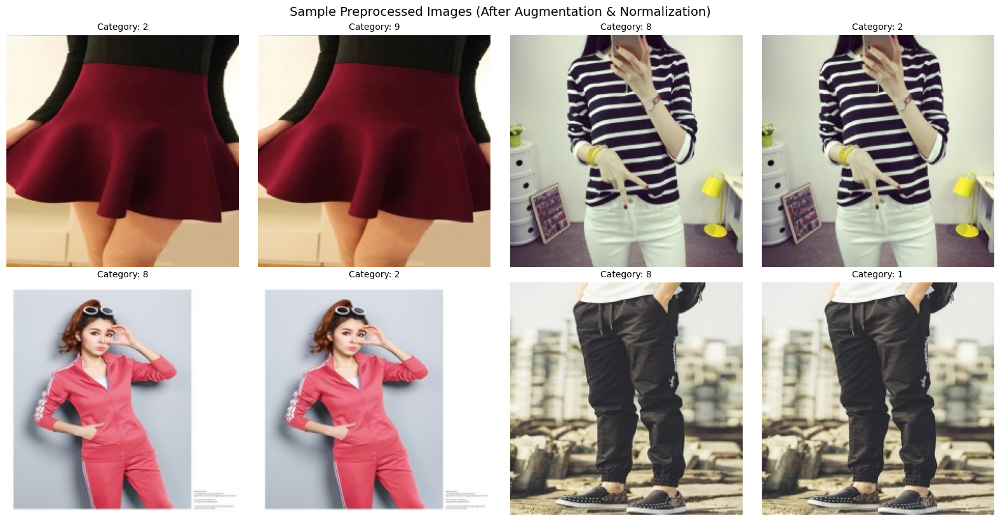

In [23]:
# Visualize validation samples (no augmentation)
print("\nValidation samples (without augmentation):")
visualize_batch(val_loader, num_images=8)

## EDA (After Preprocessing)

### Category Distribution analysis

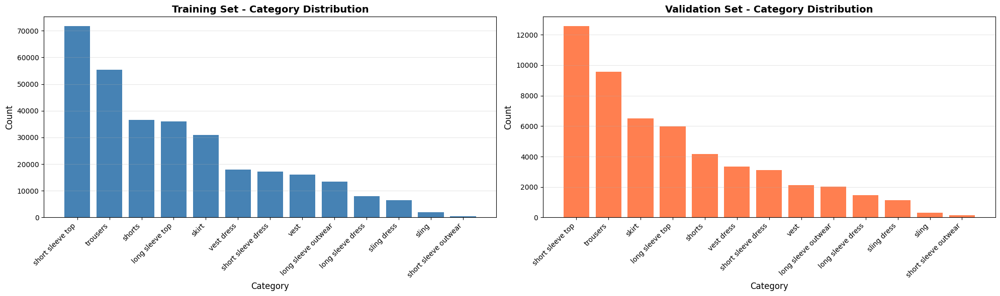


Category ID Mapping:
  ID  1: short sleeve top          - Train:  71645, Val: 12556
  ID  2: long sleeve top           - Train:  36064, Val:  5966
  ID  3: short sleeve outwear      - Train:    543, Val:   142
  ID  4: long sleeve outwear       - Train:  13457, Val:  2011
  ID  5: vest                      - Train:  16095, Val:  2113
  ID  6: sling                     - Train:   1985, Val:   322
  ID  7: shorts                    - Train:  36616, Val:  4167
  ID  8: trousers                  - Train:  55387, Val:  9586
  ID  9: skirt                     - Train:  30835, Val:  6522
  ID 10: short sleeve dress        - Train:  17211, Val:  3127
  ID 11: long sleeve dress         - Train:   7907, Val:  1477
  ID 12: vest dress                - Train:  17949, Val:  3352
  ID 13: sling dress               - Train:   6492, Val:  1149


In [24]:
# Analyze category distribution
fig, axes = plt.subplots(1, 2, figsize=(20, 6))

# Training set category distribution
train_category_counts = train_df_resized['category_name'].value_counts()
axes[0].bar(range(len(train_category_counts)), train_category_counts.values, color='steelblue')
axes[0].set_xlabel('Category', fontsize=12)
axes[0].set_ylabel('Count', fontsize=12)
axes[0].set_title('Training Set - Category Distribution', fontsize=14, fontweight='bold')
axes[0].set_xticks(range(len(train_category_counts)))
axes[0].set_xticklabels(train_category_counts.index, rotation=45, ha='right')
axes[0].grid(axis='y', alpha=0.3)

# Validation set category distribution
val_category_counts = validation_df_resized['category_name'].value_counts()
axes[1].bar(range(len(val_category_counts)), val_category_counts.values, color='coral')
axes[1].set_xlabel('Category', fontsize=12)
axes[1].set_ylabel('Count', fontsize=12)
axes[1].set_title('Validation Set - Category Distribution', fontsize=14, fontweight='bold')
axes[1].set_xticks(range(len(val_category_counts)))
axes[1].set_xticklabels(val_category_counts.index, rotation=45, ha='right')
axes[1].grid(axis='y', alpha=0.3)

plt.tight_layout()
plt.show()

print("\nCategory ID Mapping:")
category_mapping = train_df_resized[['category_id', 'category_name']].drop_duplicates().sort_values('category_id')
for _, row in category_mapping.iterrows():
    count_train = len(train_df_resized[train_df_resized['category_id'] == row['category_id']])
    count_val = len(validation_df_resized[validation_df_resized['category_id'] == row['category_id']])
    print(f"  ID {row['category_id']:2d}: {row['category_name']:25s} - Train: {count_train:6d}, Val: {count_val:5d}")

### Visualise Images with Bounding Boxes

Visualizing Bounding Boxes for Each Category:

  Category  1 (short sleeve top         ): BBox [2.871794871794872, 6.03486529318542, 220.17094017094018, 121.05229793977813]
  Category  2 (long sleeve top          ): BBox [19.145299145299145, 0.0, 170.8717948717949, 168.47863247863248]
  Category  3 (short sleeve outwear     ): BBox [67.89999999999999, 37.333333333333336, 157.14999999999998, 100.33333333333333]
  Category  4 (long sleeve outwear      ): BBox [79.44999999999999, 54.25, 154.7, 133.35]
  Category  5 (vest                     ): BBox [68.69333333333334, 10.338461538461539, 128.72533333333334, 140.0]
  Category  6 (sling                    ): BBox [70.83760683760684, 87.74928774928775, 162.25641025641028, 189.53846153846155]
  Category  7 (shorts                   ): BBox [65.10933333333334, 125.35384615384616, 129.92000000000002, 219.26153846153846]
  Category  8 (trousers                 ): BBox [73.14999999999999, 92.05, 135.45, 188.64999999999998]
  Category  9 (skirt   

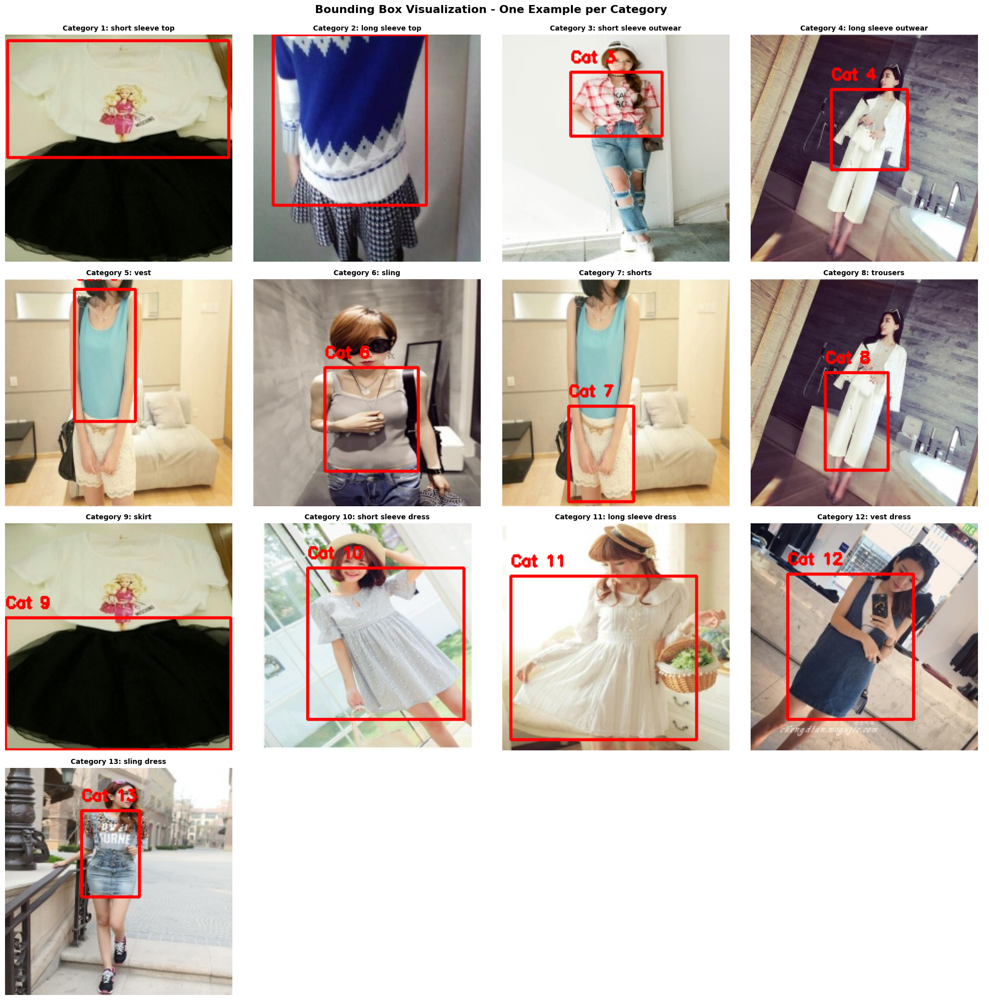

In [25]:
def draw_bbox_on_image(img_path, bbox, title=""):
    """
    Draw bounding box on image.
    
    Args:
        img_path: Path to the image
        bbox: Bounding box coordinates [x_min, y_min, x_max, y_max]
        title: Title for the plot
    """
    # Read image
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    # Draw bounding box
    x_min, y_min, x_max, y_max = map(int, bbox)
    cv2.rectangle(img, (x_min, y_min), (x_max, y_max), (255, 0, 0), 2)
    
    # Add label
    cv2.putText(img, title, (x_min, y_min - 10), 
                cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 0, 0), 2)
    
    return img


# Get one sample from each category
unique_categories = train_df_resized['category_id'].unique()
num_categories = len(unique_categories)

# Create subplot grid
cols = 4
rows = (num_categories + cols - 1) // cols
fig, axes = plt.subplots(rows, cols, figsize=(20, rows * 5))
axes = axes.flatten()

print("Visualizing Bounding Boxes for Each Category:\n")

for idx, cat_id in enumerate(sorted(unique_categories)):
    # Get one sample from this category
    sample = train_df_resized[train_df_resized['category_id'] == cat_id].iloc[0]
    
    # Draw bbox on image
    img_with_bbox = draw_bbox_on_image(
        sample['path'], 
        sample['b_box'],
        f"Cat {cat_id}"
    )
    
    # Display
    axes[idx].imshow(img_with_bbox)
    axes[idx].axis('off')
    axes[idx].set_title(f"Category {cat_id}: {sample['category_name']}", 
                       fontsize=10, fontweight='bold')
    
    print(f"  Category {cat_id:2d} ({sample['category_name']:25s}): BBox {sample['b_box']}")

# Hide extra subplots
for idx in range(num_categories, len(axes)):
    axes[idx].axis('off')

plt.suptitle("Bounding Box Visualization - One Example per Category", 
             fontsize=16, fontweight='bold', y=0.995)
plt.tight_layout()
plt.show()

### Visualise Images wwith segmentation Masks

Visualizing Segmentation Masks for Each Category:

  Category  1 (short sleeve top         ): 4 polygon(s)
  Category  2 (long sleeve top          ): 3 polygon(s)
  Category  3 (short sleeve outwear     ): 4 polygon(s)
  Category  4 (long sleeve outwear      ): 6 polygon(s)
  Category  5 (vest                     ): 1 polygon(s)
  Category  6 (sling                    ): 1 polygon(s)
  Category  7 (shorts                   ): 3 polygon(s)
  Category  8 (trousers                 ): 3 polygon(s)
  Category  9 (skirt                    ): 1 polygon(s)
  Category 10 (short sleeve dress       ): 3 polygon(s)
  Category 11 (long sleeve dress        ): 5 polygon(s)
  Category 12 (vest dress               ): 1 polygon(s)
  Category 13 (sling dress              ): 1 polygon(s)


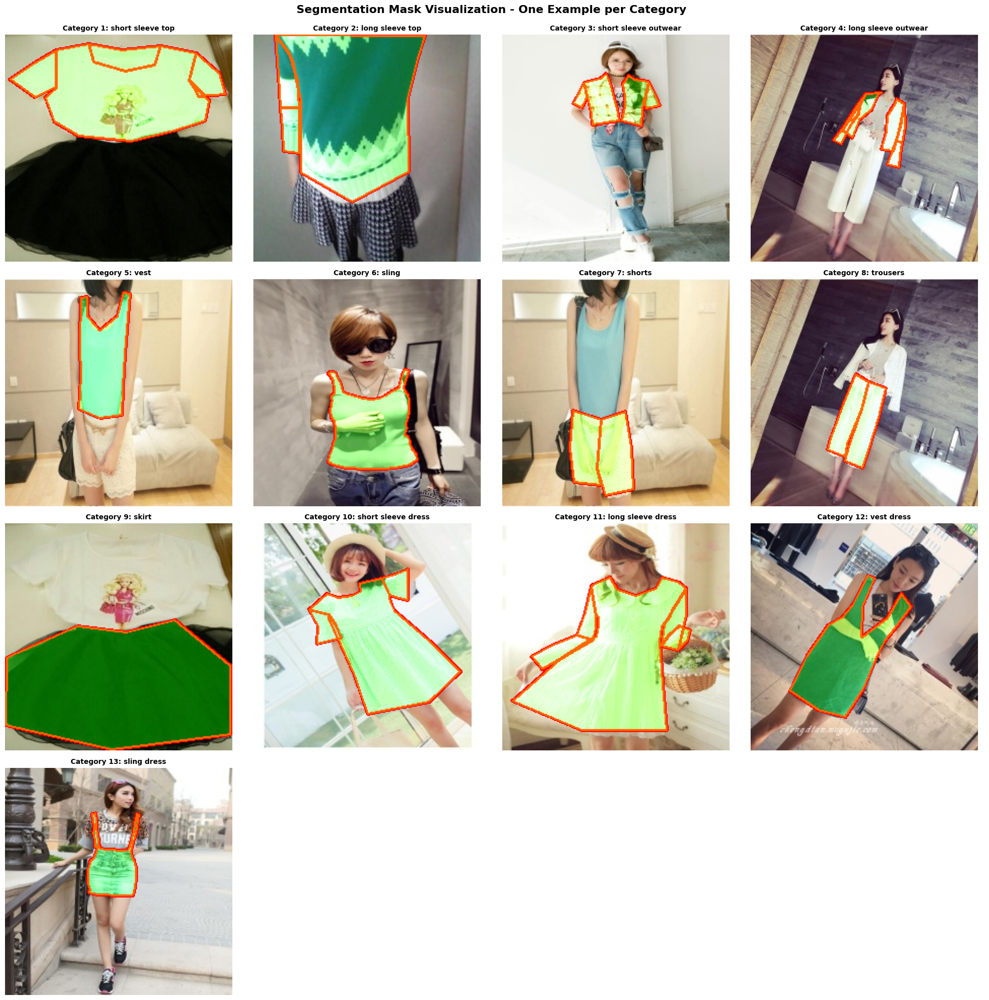

In [26]:
def draw_segmentation_on_image(img_path, segmentation, alpha=0.5):
    """
    Draw segmentation mask on image.
    
    Args:
        img_path: Path to the image
        segmentation: List of polygons (each polygon is a list of coordinates)
        alpha: Transparency of the mask
    """
    # Read image
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    # Create mask
    mask = np.zeros_like(img)
    
    # Draw each polygon
    for polygon in segmentation:
        # Reshape polygon to proper format
        points = np.array(polygon).reshape(-1, 2).astype(np.int32)
        
        # Fill polygon with color
        cv2.fillPoly(mask, [points], (0, 255, 0))
        
        # Draw polygon outline
        cv2.polylines(img, [points], True, (255, 0, 0), 2)
    
    # Blend mask with image
    img_with_mask = cv2.addWeighted(img, 1, mask, alpha, 0)
    
    return img_with_mask


# Create subplot grid
fig, axes = plt.subplots(rows, cols, figsize=(20, rows * 5))
axes = axes.flatten()

print("Visualizing Segmentation Masks for Each Category:\n")

for idx, cat_id in enumerate(sorted(unique_categories)):
    # Get one sample from this category
    sample = train_df_resized[train_df_resized['category_id'] == cat_id].iloc[0]
    
    # Draw segmentation on image
    img_with_seg = draw_segmentation_on_image(
        sample['path'], 
        sample['segmentation'],
        alpha=0.4
    )
    
    # Display
    axes[idx].imshow(img_with_seg)
    axes[idx].axis('off')
    axes[idx].set_title(f"Category {cat_id}: {sample['category_name']}", 
                       fontsize=10, fontweight='bold')
    
    num_polygons = len(sample['segmentation'])
    print(f"  Category {cat_id:2d} ({sample['category_name']:25s}): {num_polygons} polygon(s)")

# Hide extra subplots
for idx in range(num_categories, len(axes)):
    axes[idx].axis('off')

plt.suptitle("Segmentation Mask Visualization - One Example per Category", 
             fontsize=16, fontweight='bold', y=0.995)
plt.tight_layout()
plt.show()

## Visualise images with landmarks

Enhanced Landmark Visualization with Diagnostics:

Legend: Green = Visible | Orange = Occluded | Gray = Hidden/Not Visible

----------------------------------------------------------------------------------------------------
Category  1 (short sleeve top         ): 25 landmarks | Visible: 22 | Occluded:  0 | Hidden:  3 | Avg visibility rate: 88.0%
Category  2 (long sleeve top          ): 33 landmarks | Visible: 16 | Occluded:  0 | Hidden: 17 | Avg visibility rate: 48.5%
Category  3 (short sleeve outwear     ): 31 landmarks | Visible: 28 | Occluded:  3 | Hidden:  0 | Avg visibility rate: 90.3%
Category  4 (long sleeve outwear      ): 39 landmarks | Visible: 30 | Occluded:  9 | Hidden:  0 | Avg visibility rate: 76.9%
Category  5 (vest                     ): 15 landmarks | Visible:  8 | Occluded:  4 | Hidden:  3 | Avg visibility rate: 53.3%
Category  6 (sling                    ): 15 landmarks | Visible: 12 | Occluded:  3 | Hidden:  0 | Avg visibility rate: 80.0%
Category  7 (shorts      

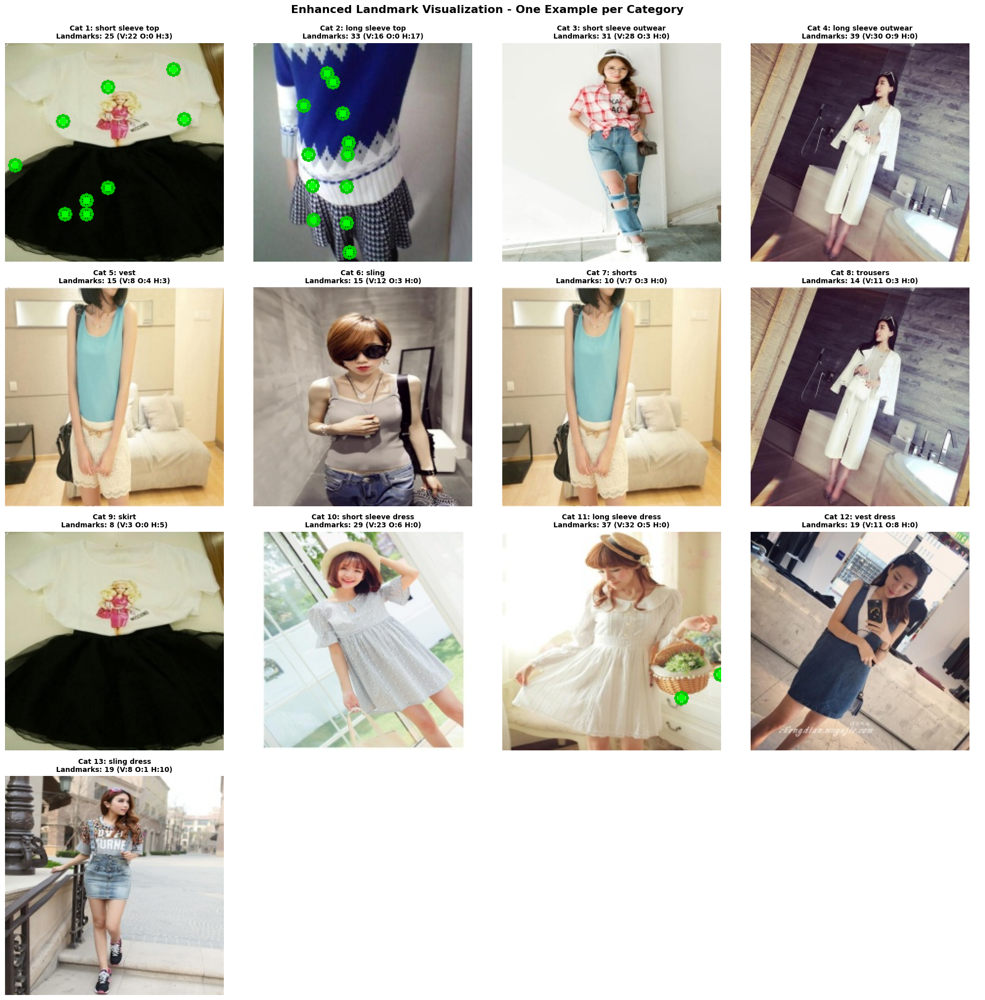

In [27]:
def draw_landmarks_on_image(img_path, landmarks, confidence_threshold=0.3):
    """
    Draw landmarks (keypoints) on image with improved visualization.
    
    Args:
        img_path: Path to the image
        landmarks: List of landmark coordinates [x1, y1, v1, x2, y2, v2, ...]
                  where v is visibility/confidence (0=not visible, 1=occluded, 2=visible)
        confidence_threshold: Minimum confidence to draw a landmark
    """
    # Read image
    img = cv2.imread(img_path)
    if img is None:
        print(f"Warning: Could not read image {img_path}")
        return None
    
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    h, w = img.shape[:2]
    
    # Parse landmarks (format: x, y, visibility/confidence)
    drawn_count = 0
    invalid_count = 0
    
    for i in range(0, len(landmarks), 3):
        if i + 2 < len(landmarks):
            x, y, visibility = int(landmarks[i]), int(landmarks[i+1]), int(landmarks[i+2])
            
            # Validate coordinates
            if x < 0 or x >= w or y < 0 or y >= h:
                invalid_count += 1
                continue
            
            # Draw based on visibility
            if visibility == 2:  # Visible
                cv2.circle(img, (x, y), 4, (0, 255, 0), -1)  # Green filled
                cv2.circle(img, (x, y), 6, (0, 200, 0), 2)   # Green outline
                drawn_count += 1
            elif visibility == 1:  # Occluded
                cv2.circle(img, (x, y), 4, (0, 165, 255), -1)  # Orange filled
                cv2.circle(img, (x, y), 6, (0, 140, 255), 2)   # Orange outline
                drawn_count += 1
            elif visibility == 0:  # Not visible - draw as ghost point
                cv2.circle(img, (x, y), 3, (200, 200, 200), 1)  # Light gray outline
    
    return img, drawn_count, invalid_count


def analyze_landmark_distribution(train_df, category_id):
    """
    Analyze why landmarks might not be detecting properly.
    """
    cat_data = train_df[train_df['category_id'] == category_id]
    
    stats = {
        'samples': len(cat_data),
        'avg_landmarks': 0,
        'avg_visible': 0,
        'avg_occluded': 0,
        'avg_hidden': 0,
        'samples_with_landmarks': 0
    }
    
    for _, row in cat_data.iterrows():
        landmarks = row['landmarks']
        if landmarks and len(landmarks) > 0:
            stats['samples_with_landmarks'] += 1
            num_landmarks = len(landmarks) // 3
            visible = sum(1 for i in range(2, len(landmarks), 3) if landmarks[i] == 2)
            occluded = sum(1 for i in range(2, len(landmarks), 3) if landmarks[i] == 1)
            hidden = sum(1 for i in range(2, len(landmarks), 3) if landmarks[i] == 0)
            
            stats['avg_landmarks'] += num_landmarks
            stats['avg_visible'] += visible
            stats['avg_occluded'] += occluded
            stats['avg_hidden'] += hidden
    
    if stats['samples_with_landmarks'] > 0:
        stats['avg_landmarks'] /= stats['samples_with_landmarks']
        stats['avg_visible'] /= stats['samples_with_landmarks']
        stats['avg_occluded'] /= stats['samples_with_landmarks']
        stats['avg_hidden'] /= stats['samples_with_landmarks']
    
    return stats


def visualize_landmarks_enhanced(train_df, unique_categories, rows=4, cols=4):
    """
    Enhanced visualization with better handling of missing landmarks.
    """
    # Create subplot grid
    fig, axes = plt.subplots(rows, cols, figsize=(20, rows * 5))
    axes = axes.flatten()
    
    print("Enhanced Landmark Visualization with Diagnostics:\n")
    print("Legend: Green = Visible | Orange = Occluded | Gray = Hidden/Not Visible\n")
    print("-" * 100)
    
    for idx, cat_id in enumerate(sorted(unique_categories)):
        if idx >= len(axes):
            break
        
        # Get samples from this category
        cat_samples = train_df[train_df['category_id'] == cat_id]
        
        if len(cat_samples) == 0:
            axes[idx].text(0.5, 0.5, 'No samples', ha='center', va='center')
            axes[idx].axis('off')
            continue
        
        # Use first sample
        sample = cat_samples.iloc[0]
        
        # Draw landmarks
        result = draw_landmarks_on_image(sample['path'], sample['landmarks'])
        
        if result is None:
            axes[idx].text(0.5, 0.5, 'Image not found', ha='center', va='center')
            axes[idx].axis('off')
            continue
        
        img_with_landmarks, drawn, invalid = result
        
        # Display image
        axes[idx].imshow(img_with_landmarks)
        axes[idx].axis('off')
        
        # Get statistics
        landmarks = sample['landmarks']
        num_landmarks = len(landmarks) // 3
        visible = sum(1 for i in range(2, len(landmarks), 3) if landmarks[i] == 2)
        occluded = sum(1 for i in range(2, len(landmarks), 3) if landmarks[i] == 1)
        hidden = sum(1 for i in range(2, len(landmarks), 3) if landmarks[i] == 0)
        
        # Category name and statistics
        cat_name = sample['category_name']
        axes[idx].set_title(
            f"Cat {cat_id}: {cat_name}\n"
            f"Landmarks: {num_landmarks} (V:{visible} O:{occluded} H:{hidden})",
            fontsize=10, fontweight='bold'
        )
        
        # Get overall category stats
        cat_stats = analyze_landmark_distribution(train_df, cat_id)
        
        print(f"Category {cat_id:2d} ({cat_name:25s}): "
              f"{num_landmarks} landmarks | "
              f"Visible: {visible:2d} | Occluded: {occluded:2d} | Hidden: {hidden:2d} | "
              f"Avg visibility rate: {(visible/num_landmarks)*100:.1f}%")
    
    # Hide extra subplots
    for idx in range(len(unique_categories), len(axes)):
        axes[idx].axis('off')
    
    plt.suptitle("Enhanced Landmark Visualization - One Example per Category", 
                 fontsize=16, fontweight='bold', y=0.995)
    plt.tight_layout()
    plt.show()
visualize_landmarks_enhanced(train_df_resized, unique_categories)

## Feature Extraction

### Collect all the variables

In [ ]:
train_df = train_df_resized.copy()
validation_df = validation_df_resized.copy()
test_df = test_df_resized.copy()

del train_df_resized
del validation_df_resized
del test_df_resized

# Delete visualization and EDA variables
del ax, axes, fig, rows, cols, idx
del img_with_bbox, img_with_seg, sample, row
del unique_categories, category_mapping, cat_id, num_categories, num_polygons
del count_train, count_val, train_category_counts, val_category_counts

# Delete old path constants no longer needed
del ORIGINAL_TRAIN, ORIGINAL_VALIDATION, ORIGINAL_TEST
del TRAIN_DATAFRAMES, VALIDATION_DATAFRAMES, TEST_DATAFRAMES
del dataset_path, RESIZED_TARGET_DIRECTORY, TARGET_DIR

# Delete dataset and loader objects (can be recreated when needed for feature extraction)
del train_dataset, val_dataset, test_dataset
del train_loader, val_loader, test_loader


gc.collect()

98001

### Set Device and Paths

In [41]:
INPUT_DIR = os.path.join(ROOT_DIR, "input/")
RESIZED_DIR = os.path.join(ROOT_DIR, "resized/")

os.makedirs(ROOT_DIR+'FEATURES_DIR/', exist_ok=True)
FEATURES_DIR = ROOT_DIR+'FEATURES_DIR/'

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Computation will be performed on: {device}")
print(f"\nData paths configured:")
print(f"  Input CSV directory: {INPUT_DIR}")
print(f"  Resized images directory: {RESIZED_DIR}")
print(f"  Features output directory: {FEATURES_DIR}")

Computation will be performed on: cuda

Data paths configured:
  Input CSV directory: /home/vishn/Documents/5/ML/Code/Project/output1/input/
  Resized images directory: /home/vishn/Documents/5/ML/Code/Project/output1/resized/
  Features output directory: /home/vishn/Documents/5/ML/Code/Project/output1/FEATURES_DIR/


### Define ResNet-50 Feature Extractor

In [38]:
class ResNet50FeatureExtractor(nn.Module):
    """
    ResNet-50 Feature Extractor for Transfer Learning
    
    This model uses a pre-trained ResNet-50 (trained on ImageNet) to extract
    2048-dimensional feature vectors from images. The final classification
    layer is removed, and we extract features from the global average pooling layer.
    
    Args:
        pretrained (bool): Whether to load ImageNet pre-trained weights
        fine_tune (bool): Whether to allow gradient updates (True) or freeze weights (False)
        freeze_until_layer (str): Optionally freeze layers up to a specific layer name
                                   Options: 'layer1', 'layer2', 'layer3', 'layer4', None
    """
    
    def __init__(self, pretrained=True, fine_tune=True, freeze_until_layer=None):
        super(ResNet50FeatureExtractor, self).__init__()
        
        # Load pre-trained ResNet-50
        resnet = models.resnet50(pretrained=pretrained)
        
        # Remove the final fully connected layer (fc)
        # Keep everything up to and including the adaptive average pooling layer
        self.backbone = nn.Sequential(*list(resnet.children())[:-1])
        
        # Set gradient requirements
        if not fine_tune:
            # Freeze all layers
            for param in self.backbone.parameters():
                param.requires_grad = False
        elif freeze_until_layer is not None:
            # Freeze layers selectively
            self._freeze_layers_until(resnet, freeze_until_layer)
        
        # Store layer names for reference
        self.layer_names = [name for name, _ in resnet.named_children() if name != 'fc']
        
        print(f"ResNet-50 Feature Extractor initialized:")
        print(f"  - Pre-trained weights: {pretrained}")
        print(f"  - Fine-tuning enabled: {fine_tune}")
        print(f"  - Frozen until layer: {freeze_until_layer}")
        print(f"  - Output feature dimension: 2048")
    
    def _freeze_layers_until(self, resnet, layer_name):
        """
        Freeze all layers up to and including the specified layer.
        
        Args:
            resnet: The original ResNet model
            layer_name: Name of the layer to freeze until ('layer1', 'layer2', 'layer3', 'layer4')
        """
        freeze = True
        layer_order = ['conv1', 'bn1', 'relu', 'maxpool', 'layer1', 'layer2', 'layer3', 'layer4']
        
        for name, child in resnet.named_children():
            if name == 'fc':  # Skip the final fc layer
                continue
            
            if freeze:
                for param in child.parameters():
                    param.requires_grad = False
                print(f"  Frozen layer: {name}")
            else:
                for param in child.parameters():
                    param.requires_grad = True
                print(f"  Trainable layer: {name}")
            
            # Stop freezing after reaching the specified layer
            if name == layer_name:
                freeze = False
    
    def forward(self, x):
        """
        Extract features from input images.
        
        Args:
            x: Input tensor of shape (batch_size, 3, H, W)
        
        Returns:
            features: Feature tensor of shape (batch_size, 2048)
        """
        features = self.backbone(x)  # Shape: (batch_size, 2048, 1, 1)
        features = features.view(features.size(0), -1)  # Flatten to (batch_size, 2048)
        return features
    
    def get_num_params(self):
        """Return the total number of parameters in the model."""
        return sum(p.numel() for p in self.parameters())
    
    def get_num_trainable_params(self):
        """Return the number of trainable parameters."""
        return sum(p.numel() for p in self.parameters() if p.requires_grad)

### Initialise feature extractor model

In [43]:
# Initialize the feature extractor
# For feature extraction only (no training), set fine_tune=False to freeze all weights
feature_extractor = ResNet50FeatureExtractor(
    pretrained=True,
    fine_tune=False,  # Freeze all layers for pure feature extraction
    freeze_until_layer=None
)

# Move model to device
feature_extractor = feature_extractor.to(device)
feature_extractor.eval()  # Set to evaluation mode

print(f"\nModel Statistics:")
print(f"  Total parameters: {feature_extractor.get_num_params():,}")
print(f"  Trainable parameters: {feature_extractor.get_num_trainable_params():,}")


ResNet-50 Feature Extractor initialized:
  - Pre-trained weights: True
  - Fine-tuning enabled: False
  - Frozen until layer: None
  - Output feature dimension: 2048

Model Statistics:
  Total parameters: 23,508,032
  Trainable parameters: 0


### Define Transform Pipelines 

In [45]:
class FashionFeatureDataset(Dataset):
    """
    Dataset for feature extraction from preprocessed DeepFashion2 images.
    """
    
    def __init__(self, dataframe: pd.DataFrame, transform=None):
        """
        Args:
            dataframe: Pandas DataFrame with image paths and metadata
            transform: torchvision transforms to apply
        """
        self.df = dataframe.reset_index(drop=True)
        self.transform = transform
        
    def __len__(self):
        return len(self.df)
    
    def __getitem__(self, idx):
        row = self.df.iloc[idx]
        
        # Load image
        img_path = row['path']
        
        # Handle different possible image loading scenarios
        try:
            image = cv2.imread(img_path)
            if image is None:
                raise ValueError(f"Failed to load image: {img_path}")
            image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        except Exception as e:
            print(f"Error loading image {img_path}: {e}")
            # Return a black image as fallback
            image = np.zeros((224, 224, 3), dtype=np.uint8)
        
        # Apply transforms
        if self.transform:
            image = self.transform(image)
        
        # Get image identifier
        img_name = os.path.basename(img_path)
        
        # Prepare metadata
        sample = {
            'image': image,
            'image_id': img_name,
            'image_path': img_path,
            'index': idx
        }
        
        # Add category info if available
        if 'category_id' in row:
            sample['category_id'] = row['category_id']
        if 'category_name' in row:
            sample['category_name'] = row['category_name']
        if 'style' in row:
            sample['style'] = row['style']
        
        return sample


### Create Datasets and Dataloaders

In [46]:
train_dataset = FashionFeatureDataset(train_df, transform=train_transforms)
val_dataset = FashionFeatureDataset(validation_df, transform=val_transforms)
test_dataset = FashionFeatureDataset(test_df, transform=val_transforms)

print(f"\n  Train: {len(train_dataset)} samples")
print(f"  Validation: {len(val_dataset)} samples")
print(f"  Test: {len(test_dataset)} samples")

# Batch size for feature extraction
BATCH_SIZE = 64

# Create dataloaders
train_loader = DataLoader(
    train_dataset,
    batch_size=BATCH_SIZE,
    shuffle=False,  # Keep order for easier matching with dataframe
    num_workers=2,
    pin_memory=torch.cuda.is_available()
)

val_loader = DataLoader(
    val_dataset,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=2,
    pin_memory=torch.cuda.is_available()
)

test_loader = DataLoader(
    test_dataset,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=2,
    pin_memory=torch.cuda.is_available()
)

print(f"\nDataLoaders created with batch_size={BATCH_SIZE}")
print(f"  Train batches: {len(train_loader)}")
print(f"  Validation batches: {len(val_loader)}")
print(f"  Test batches: {len(test_loader)}")


  Train: 312186 samples
  Validation: 52490 samples
  Test: 62629 samples

DataLoaders created with batch_size=64
  Train batches: 4878
  Validation batches: 821
  Test batches: 979


### Feature Extraction Function

In [47]:
def extract_features(model, dataloader, device, desc="Extracting features"):
    """
    Extract features from all images in the dataloader.
    
    Args:
        model: Feature extraction model (ResNet50FeatureExtractor)
        dataloader: PyTorch DataLoader
        device: torch.device (cuda or cpu)
        desc: Description for the progress bar
    
    Returns:
        features_array: Numpy array of shape (num_samples, 2048)
        metadata_list: List of dictionaries containing metadata for each sample
    """
    model.eval()
    
    all_features = []
    all_metadata = []
    
    with torch.no_grad():
        for batch in tqdm(dataloader, desc=desc):
            # Move images to device
            images = batch['image'].to(device)
            
            # Extract features
            features = model(images)  # Shape: (batch_size, 2048)
            
            # Move to CPU and convert to numpy
            features_np = features.cpu().numpy()
            all_features.append(features_np)
            
            # Store metadata
            batch_size = len(batch['image_id'])
            for i in range(batch_size):
                metadata = {
                    'image_id': batch['image_id'][i],
                    'image_path': batch['image_path'][i],
                    'index': batch['index'][i].item()
                }
                
                # Add category info if available
                if 'category_id' in batch:
                    metadata['category_id'] = batch['category_id'][i].item()
                if 'category_name' in batch:
                    metadata['category_name'] = batch['category_name'][i]
                if 'style' in batch:
                    metadata['style'] = batch['style'][i].item()
                
                all_metadata.append(metadata)
    
    # Concatenate all features
    features_array = np.vstack(all_features)
    
    print(f"\nFeature extraction complete!")
    print(f"  Features shape: {features_array.shape}")
    print(f"  Metadata entries: {len(all_metadata)}")
    
    return features_array, all_metadata


### Extracting Features for ALL Datasets

#### Train set

In [48]:
# Extract features for training set
print("=" * 80)
print("EXTRACTING FEATURES FOR TRAINING SET")
print("=" * 80)
train_features, train_metadata = extract_features(
    feature_extractor, 
    train_loader, 
    device, 
    desc="Train set"
)

EXTRACTING FEATURES FOR TRAINING SET


Train set: 100%|██████████| 4878/4878 [34:34<00:00,  2.35it/s]



Feature extraction complete!
  Features shape: (312186, 2048)
  Metadata entries: 312186


#### Validation Set

In [49]:
# Extract features for validation set
print("\n" + "=" * 80)
print("EXTRACTING FEATURES FOR VALIDATION SET")
print("=" * 80)
val_features, val_metadata = extract_features(
    feature_extractor, 
    val_loader, 
    device, 
    desc="Validation set"
)


EXTRACTING FEATURES FOR VALIDATION SET


Validation set: 100%|██████████| 821/821 [04:24<00:00,  3.10it/s]



Feature extraction complete!
  Features shape: (52490, 2048)
  Metadata entries: 52490


#### Test set

In [50]:
# Extract features for test set
print("\n" + "=" * 80)
print("EXTRACTING FEATURES FOR TEST SET")
print("=" * 80)
test_features, test_metadata = extract_features(
    feature_extractor, 
    test_loader, 
    device, 
    desc="Test set"
)


EXTRACTING FEATURES FOR TEST SET


Test set: 100%|██████████| 979/979 [05:15<00:00,  3.10it/s]



Feature extraction complete!
  Features shape: (62629, 2048)
  Metadata entries: 62629


### Save Features to CSV Files

In [51]:
def save_features_to_csv(original_df, features_array, output_path, dataset_name):
    """
    Save extracted features along with original dataframe information to CSV.
    
    Args:
        original_df: Original pandas DataFrame
        features_array: Numpy array of extracted features (num_samples, 2048)
        output_path: Path to save the output CSV
        dataset_name: Name of the dataset (for logging)
    
    Returns:
        df_with_features: DataFrame with original columns + feature columns
    """
    print(f"\nSaving {dataset_name} features to CSV...")
    
    # Create a copy of the original dataframe
    df_with_features = original_df.copy()
    
    # Add each feature dimension as a separate column
    for i in range(features_array.shape[1]):
        df_with_features[f'feature_{i}'] = features_array[:, i]
    
    # Save to CSV
    df_with_features.to_csv(output_path, index=False)
    
    print(f"  Saved to: {output_path}")
    print(f"  Shape: {df_with_features.shape}")
    print(f"  Columns: {len(df_with_features.columns)} ({len(original_df.columns)} original + {features_array.shape[1]} features)")
    
    # Display file size
    file_size_mb = os.path.getsize(output_path) / (1024 * 1024)
    print(f"  File size: {file_size_mb:.2f} MB")
    
    return df_with_features


In [52]:
# Save features for all datasets
print("=" * 80)
print("SAVING EXTRACTED FEATURES")
print("=" * 80)

train_features_csv = os.path.join(FEATURES_DIR, "train_with_features.csv")
val_features_csv = os.path.join(FEATURES_DIR, "validation_with_features.csv")
test_features_csv = os.path.join(FEATURES_DIR, "test_with_features.csv")

# Save training features
train_df_with_features = save_features_to_csv(
    train_df, 
    train_features,
    train_features_csv,
    "Training"
)

# Save validation features
val_df_with_features = save_features_to_csv(
    validation_df, 
    val_features,
    val_features_csv,
    "Validation"
)

# Save test features
test_df_with_features = save_features_to_csv(
    test_df, 
    test_features,
    test_features_csv,
    "Test"
)


SAVING EXTRACTED FEATURES

Saving Training features to CSV...
  Saved to: /home/vishn/Documents/5/ML/Code/Project/output1/FEATURES_DIR/train_with_features.csv
  Shape: (312186, 2060)
  Columns: 2060 (12 original + 2048 features)
  File size: 7025.26 MB

Saving Validation features to CSV...
  Saved to: /home/vishn/Documents/5/ML/Code/Project/output1/FEATURES_DIR/validation_with_features.csv
  Shape: (52490, 2060)
  Columns: 2060 (12 original + 2048 features)
  File size: 1296.40 MB

Saving Test features to CSV...
  Saved to: /home/vishn/Documents/5/ML/Code/Project/output1/FEATURES_DIR/test_with_features.csv
  Shape: (62629, 2051)
  Columns: 2051 (3 original + 2048 features)
  File size: 1310.41 MB


### Save Features as Numpy Arrays for faster loadings

In [53]:
# Save as numpy arrays for faster loading in future
np.save(os.path.join(FEATURES_DIR, 'train_features.npy'), train_features)
np.save(os.path.join(FEATURES_DIR, 'val_features.npy'), val_features)
np.save(os.path.join(FEATURES_DIR, 'test_features.npy'), test_features)


### Delete unusable vars

In [ ]:
# Keep train_df, validation_df, test_df and their features
train_df = train_df_with_features.copy()
val_df = val_df_with_features.copy()
test_df = test_df_with_features.copy()

del train_df_with_features
del val_df_with_features
del test_df_with_features

# Delete all metadata (features already saved separately)
del train_metadata, val_metadata, test_metadata

# Delete all datasets and dataloaders
del train_dataset, val_dataset, test_dataset
del train_loader, val_loader, test_loader

# Delete the feature extractor model (no longer needed)
del feature_extractor

# Delete transform objects
del train_transforms, val_transforms, test_transforms

# Delete path variables for CSVs (already saved)
del train_features_csv, val_features_csv, test_features_csv

# Run garbage collection
gc.collect()

0

## PartAware Pooling 

#### Load the data (because it crashed)

In [10]:
ROOT_DIR = "/home/vishn/Documents/5/ML/Code/Project/output1/"

train_features = np.load(os.path.join(ROOT_DIR, 'FEATURES_DIR', 'train_features.npy'))
val_features = np.load(os.path.join(ROOT_DIR, 'FEATURES_DIR', 'val_features.npy'))
test_features = np.load(os.path.join(ROOT_DIR, 'FEATURES_DIR', 'test_features.npy'))

train_df = pd.read_csv(os.path.join(ROOT_DIR, 'FEATURES_DIR', 'train_with_features.csv'))
validation_df = pd.read_csv(os.path.join(ROOT_DIR, 'FEATURES_DIR', 'validation_with_features.csv'))
test_df = pd.read_csv(os.path.join(ROOT_DIR, 'FEATURES_DIR', 'test_with_features.csv'))

### Create Directory

In [5]:
PARTAWARE_DIR = os.path.join(ROOT_DIR, "PartAwarePooling/")
os.makedirs(PARTAWARE_DIR, exist_ok=True)


In [13]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

### Part aware Pooling Functions

In [6]:
def normalize_masks(part_masks):
    """Normalize part masks to [0, 1] range."""
    eps = 1e-8
    B, K, H, W = part_masks.shape
    masks_flat = part_masks.view(B, K, -1)
    mask_min = masks_flat.min(dim=2, keepdim=True)[0].unsqueeze(-1)
    mask_max = masks_flat.max(dim=2, keepdim=True)[0].unsqueeze(-1)
    normalized_masks = (part_masks - mask_min) / (mask_max - mask_min + eps)
    return torch.clamp(normalized_masks, 0.0, 1.0)


def part_aware_pooling(feature_map, part_masks):
    """
    Weighted spatial pooling per part: f_k = sum(mask_k * feature_map) / sum(mask_k)
    
    Args:
        feature_map: [B, C, H, W]
        part_masks: [B, K, H, W]
    Returns:
        part_features: [B, K, C]
    """
    B, C, H, W = feature_map.shape
    _, K, _, _ = part_masks.shape
    eps = 1e-8
    part_features = torch.zeros(B, K, C, device=feature_map.device, dtype=feature_map.dtype)
    
    for k in range(K):
        mask_k = part_masks[:, k, :, :].unsqueeze(1)  # [B, 1, H, W]
        weighted_features = feature_map * mask_k
        numerator = weighted_features.sum(dim=(2, 3))  # [B, C]
        denominator = mask_k.sum(dim=(2, 3))  # [B, 1]
        part_features[:, k, :] = numerator / (denominator + eps)
    
    return part_features


def fuse_part_features(part_features, use_attention=False, attention_weights=None):
    """Fuse K part features into single representation."""
    B, K, C = part_features.shape
    
    if use_attention and attention_weights is not None:
        if attention_weights.dim() == 1:
            weights = attention_weights.view(1, K, 1)
        else:
            weights = attention_weights.unsqueeze(2)
        weights = F.softmax(weights, dim=1)
        fused_feature = (part_features * weights).sum(dim=1)
    else:
        fused_feature = part_features.mean(dim=1)  # Simple average
    
    return fused_feature


def classify(fused_feature, num_classes, classifier_weights=None, classifier_bias=None):
    """Apply linear classifier."""
    B, C = fused_feature.shape
    
    if classifier_weights is None:
        classifier_weights = torch.randn(num_classes, C, device=fused_feature.device) * 0.01
    if classifier_bias is None:
        classifier_bias = torch.zeros(num_classes, device=fused_feature.device)
    
    logits = torch.matmul(fused_feature, classifier_weights.t()) + classifier_bias
    return logits


def forward_pipeline(feature_map, part_masks, num_classes, use_attention=False, 
                     attention_weights=None, classifier_weights=None, classifier_bias=None):
    """Complete Part-Aware Pooling pipeline."""
    normalized_masks = normalize_masks(part_masks)
    part_features = part_aware_pooling(feature_map, normalized_masks)
    fused_feature = fuse_part_features(part_features, use_attention, attention_weights)
    logits = classify(fused_feature, num_classes, classifier_weights, classifier_bias)
    return logits, fused_feature, part_features

print("✓ Part-Aware Pooling functions defined")

✓ Part-Aware Pooling functions defined


### Generate Part Masks from segmentation

In [7]:
def create_part_mask(segmentation, img_size=224, target_size=7, num_parts=5):
    """Create part masks from segmentation polygons (divide into horizontal strips)."""
    full_mask = np.zeros((img_size, img_size), dtype=np.float32)
    
    for polygon in segmentation:
        points = np.array(polygon).reshape(-1, 2).astype(np.int32)
        cv2.fillPoly(full_mask, [points], 1.0)
    
    # Resize to target resolution
    mask_resized = cv2.resize(full_mask, (target_size, target_size), interpolation=cv2.INTER_LINEAR)
    
    # Divide into horizontal parts
    part_masks = np.zeros((num_parts, target_size, target_size), dtype=np.float32)
    strip_height = target_size / num_parts
    
    for k in range(num_parts):
        y_start = int(k * strip_height)
        y_end = int((k + 1) * strip_height)
        part_mask = mask_resized.copy()
        part_mask[:y_start, :] = 0
        part_mask[y_end:, :] = 0
        part_masks[k] = part_mask
    
    return torch.from_numpy(part_masks).float()


def generate_all_part_masks(df, num_parts=5, target_size=7):
    """Generate part masks for entire dataset."""
    all_masks = []
    for idx in tqdm(range(len(df)), desc="Generating part masks"):
        segmentation = df.iloc[idx]['segmentation']
        masks = create_part_mask(segmentation, target_size=target_size, num_parts=num_parts)
        all_masks.append(masks)
    return torch.stack(all_masks)

print("✓ Part mask generation functions defined")

✓ Part mask generation functions defined


### Process Full Dataset: Apply PAP

In [8]:
NUM_PARTS = 5
SPATIAL_SIZE = 7

print("="*80)
print("LOADING OR GENERATING PART MASKS")
print("="*80)

# Check if part masks already exist
train_masks_file = os.path.join(PARTAWARE_DIR, 'train_part_masks.pt')
val_masks_file = os.path.join(PARTAWARE_DIR, 'val_part_masks.pt')

if os.path.exists(train_masks_file) and os.path.exists(val_masks_file):
    print("\n✓ Found existing part masks, loading...")
    train_part_masks = torch.load(train_masks_file)
    val_part_masks = torch.load(val_masks_file)
    print(f"✓ Loaded train masks: {train_part_masks.shape}")
    print(f"✓ Loaded val masks: {val_part_masks.shape}")
else:
    print("\nPart masks not found, generating...")
    print("[1/2] Generating training part masks...")
    train_part_masks = generate_all_part_masks(train_df, NUM_PARTS, SPATIAL_SIZE)
    print(f"✓ Train masks: {train_part_masks.shape}")
    
    print("\n[2/2] Generating validation part masks...")
    val_part_masks = generate_all_part_masks(val_df, NUM_PARTS, SPATIAL_SIZE)
    print(f"✓ Val masks: {val_part_masks.shape}")
    
    # Save for future use
    torch.save(train_part_masks, train_masks_file)
    torch.save(val_part_masks, val_masks_file)
    print(f"\n✓ Part masks saved to {PARTAWARE_DIR}")

LOADING OR GENERATING PART MASKS

✓ Found existing part masks, loading...
✓ Loaded train masks: torch.Size([312186, 5, 7, 7])
✓ Loaded val masks: torch.Size([52490, 5, 7, 7])


In [11]:
print("\n"+"="*80)
print("MEMORY-EFFICIENT PROCESSING SETUP")
print("="*80)

# DON'T create full spatial tensors in memory! 
# Instead, we'll convert features to spatial format in small batches during processing
print("\n✓ Will process features in batches to avoid memory overload")
print(f"  Train samples: {len(train_features):,}")
print(f"  Val samples: {len(val_features):,}")
print(f"  Memory strategy: Convert [N,2048]→[N,2048,7,7] in batches during processing")


MEMORY-EFFICIENT PROCESSING SETUP

✓ Will process features in batches to avoid memory overload
  Train samples: 312,186
  Val samples: 52,490
  Memory strategy: Convert [N,2048]→[N,2048,7,7] in batches during processing


In [14]:
print("\n"+"="*80)
print("APPLYING PART-AWARE POOLING (BATCH-WISE SAVING)")
print("="*80)

BATCH_SIZE = 256  # Process in small batches
BATCH_DIR = os.path.join(PARTAWARE_DIR, 'batches')
os.makedirs(BATCH_DIR, exist_ok=True)

def process_and_save_batches(features_np, part_masks, batch_size, prefix):
    """
    Process dataset in batches and save each batch immediately to disk.
    This prevents memory accumulation.
    """
    n_samples = len(features_np)
    batch_files_part = []
    batch_files_fused = []
    
    for i in tqdm(range(0, n_samples, batch_size), desc=f"{prefix} batches"):
        end_idx = min(i + batch_size, n_samples)
        batch_num = i // batch_size
        
        # Convert batch to spatial format on-the-fly
        batch_features = torch.from_numpy(features_np[i:end_idx]).float()
        batch_spatial = batch_features.view(-1, 2048, 1, 1).expand(-1, 2048, SPATIAL_SIZE, SPATIAL_SIZE)
        batch_spatial = batch_spatial.to(device)
        
        # Load corresponding masks
        batch_masks = part_masks[i:end_idx].to(device)
        
        # Apply part-aware pooling
        normalized_masks = normalize_masks(batch_masks)
        part_feats = part_aware_pooling(batch_spatial, normalized_masks)
        fused_feats = fuse_part_features(part_feats, use_attention=False)
        
        # Save batch to disk immediately
        part_file = os.path.join(BATCH_DIR, f'{prefix}_part_batch_{batch_num}.npy')
        fused_file = os.path.join(BATCH_DIR, f'{prefix}_fused_batch_{batch_num}.npy')
        
        np.save(part_file, part_feats.cpu().numpy())
        np.save(fused_file, fused_feats.cpu().numpy())
        
        batch_files_part.append(part_file)
        batch_files_fused.append(fused_file)
        
        # Aggressive memory cleanup
        del batch_features, batch_spatial, batch_masks, normalized_masks, part_feats, fused_feats
        if torch.cuda.is_available():
            torch.cuda.empty_cache()
    
    return batch_files_part, batch_files_fused, n_samples

# Process training set
print(f"\n[1/2] Processing training set ({len(train_features):,} samples)...")
train_part_files, train_fused_files, train_n = process_and_save_batches(
    train_features, train_part_masks, BATCH_SIZE, 'train'
)
print(f"✓ Saved {len(train_part_files)} training batches")

# Clear memory
del train_features, train_part_masks
import gc
gc.collect()
if torch.cuda.is_available():
    torch.cuda.empty_cache()

# Process validation set
print(f"\n[2/2] Processing validation set ({len(val_features):,} samples)...")
val_part_files, val_fused_files, val_n = process_and_save_batches(
    val_features, val_part_masks, BATCH_SIZE, 'val'
)
print(f"✓ Saved {len(val_part_files)} validation batches")

# Clear memory
del val_features, val_part_masks
gc.collect()
if torch.cuda.is_available():
    torch.cuda.empty_cache()

print("\n✓ All batches processed and saved!")


APPLYING PART-AWARE POOLING (BATCH-WISE SAVING)

[1/2] Processing training set (312,186 samples)...


train batches: 100%|██████████| 1220/1220 [01:47<00:00, 11.30it/s]


✓ Saved 1220 training batches

[2/2] Processing validation set (52,490 samples)...


val batches: 100%|██████████| 206/206 [00:16<00:00, 12.18it/s]


✓ Saved 206 validation batches

✓ All batches processed and saved!


### Merge batches

In [15]:
print("\n"+"="*80)
print("MERGING BATCHES INTO FINAL FEATURES")
print("="*80)

def merge_batches_memmap(batch_files, output_file, expected_shape):
    """
    Merge batch files into a single memory-mapped array.
    This avoids loading all data into RAM at once.
    """
    # Create memory-mapped array
    memmap_array = np.memmap(output_file, dtype='float32', mode='w+', shape=expected_shape)
    
    # Copy each batch
    current_idx = 0
    for batch_file in tqdm(batch_files, desc=f"Merging to {os.path.basename(output_file)}"):
        batch_data = np.load(batch_file)
        batch_size = batch_data.shape[0]
        memmap_array[current_idx:current_idx + batch_size] = batch_data
        current_idx += batch_size
        del batch_data  # Free memory
    
    # Flush to disk
    memmap_array.flush()
    del memmap_array
    return output_file

# Merge training features
print("\n[1/4] Merging training part features...")
train_part_output = os.path.join(PARTAWARE_DIR, 'train_part_features.npy')
merge_batches_memmap(train_part_files, train_part_output, (train_n, NUM_PARTS, 2048))
print(f"✓ Saved: {train_part_output}")

print("\n[2/4] Merging training fused features...")
train_fused_output = os.path.join(PARTAWARE_DIR, 'train_fused_features.npy')
merge_batches_memmap(train_fused_files, train_fused_output, (train_n, 2048))
print(f"✓ Saved: {train_fused_output}")

# Merge validation features
print("\n[3/4] Merging validation part features...")
val_part_output = os.path.join(PARTAWARE_DIR, 'val_part_features.npy')
merge_batches_memmap(val_part_files, val_part_output, (val_n, NUM_PARTS, 2048))
print(f"✓ Saved: {val_part_output}")

print("\n[4/4] Merging validation fused features...")
val_fused_output = os.path.join(PARTAWARE_DIR, 'val_fused_features.npy')
merge_batches_memmap(val_fused_files, val_fused_output, (val_n, 2048))
print(f"✓ Saved: {val_fused_output}")

print("\n✓ All features merged successfully!")

# Clean up batch files to save disk space
print("\nCleaning up batch files...")
import shutil
shutil.rmtree(BATCH_DIR)
print(f"✓ Deleted temporary batch directory: {BATCH_DIR}")


MERGING BATCHES INTO FINAL FEATURES

[1/4] Merging training part features...


Merging to train_part_features.npy: 100%|██████████| 1220/1220 [02:25<00:00,  8.37it/s]


✓ Saved: /home/vishn/Documents/5/ML/Code/Project/output1/PartAwarePooling/train_part_features.npy

[2/4] Merging training fused features...


Merging to train_fused_features.npy: 100%|██████████| 1220/1220 [00:29<00:00, 41.78it/s]


✓ Saved: /home/vishn/Documents/5/ML/Code/Project/output1/PartAwarePooling/train_fused_features.npy

[3/4] Merging validation part features...


Merging to val_part_features.npy: 100%|██████████| 206/206 [00:17<00:00, 12.11it/s]


✓ Saved: /home/vishn/Documents/5/ML/Code/Project/output1/PartAwarePooling/val_part_features.npy

[4/4] Merging validation fused features...


Merging to val_fused_features.npy: 100%|██████████| 206/206 [00:02<00:00, 72.29it/s] 


✓ Saved: /home/vishn/Documents/5/ML/Code/Project/output1/PartAwarePooling/val_fused_features.npy

✓ All features merged successfully!

Cleaning up batch files...
✓ Deleted temporary batch directory: /home/vishn/Documents/5/ML/Code/Project/output1/PartAwarePooling/batches


### Process Test Data

In [19]:
# Load test dataset
INPUT_DIR = os.path.join(ROOT_DIR, "input/")
TEST_CSV = os.path.join(INPUT_DIR, "test.csv")

print("Loading test dataset...")
test_df = pd.read_csv(TEST_CSV)

print(f"✓ Test: {test_features.shape[0]:,} samples, features shape: {test_features.shape}")

# Create uniform grid-based masks for test set (no segmentation available)
def create_grid_masks(n_samples, num_parts=5, spatial_size=7):
    """
    Create uniform grid-based masks by dividing spatial map into horizontal strips.
    Used for test set where segmentation is not available.
    """
    masks = torch.zeros(n_samples, num_parts, spatial_size, spatial_size)
    strip_height = spatial_size / num_parts
    
    for k in range(num_parts):
        y_start = int(k * strip_height)
        y_end = int((k + 1) * strip_height)
        masks[:, k, y_start:y_end, :] = 1.0
    
    return masks

print(f"\nGenerating grid-based masks for test set (no segmentation available)...")
test_part_masks = create_grid_masks(len(test_features), NUM_PARTS, SPATIAL_SIZE)
print(f"✓ Test masks: {test_part_masks.shape}")

Loading test dataset...
✓ Test: 62,629 samples, features shape: (62629, 2048)

Generating grid-based masks for test set (no segmentation available)...
✓ Test masks: torch.Size([62629, 5, 7, 7])


In [21]:
# Process test set with batch-wise saving
print("\n"+"="*80)
print("PROCESSING TEST DATASET")
print("="*80)

# Recreate batch directory (it was deleted after train/val processing)
os.makedirs(BATCH_DIR, exist_ok=True)

print(f"\nProcessing test set ({len(test_features):,} samples)...")
test_part_files, test_fused_files, test_n = process_and_save_batches(
    test_features, test_part_masks, BATCH_SIZE, 'test'
)
print(f"✓ Saved {len(test_part_files)} test batches")

# Clear memory
del test_features, test_part_masks
import gc
gc.collect()
if torch.cuda.is_available():
    torch.cuda.empty_cache()

# Merge test batches
print("\n"+"="*80)
print("MERGING TEST BATCHES")
print("="*80)

print("\n[1/2] Merging test part features...")
test_part_output = os.path.join(PARTAWARE_DIR, 'test_part_features.npy')
merge_batches_memmap(test_part_files, test_part_output, (test_n, NUM_PARTS, 2048))
print(f"✓ Saved: {test_part_output}")

print("\n[2/2] Merging test fused features...")
test_fused_output = os.path.join(PARTAWARE_DIR, 'test_fused_features.npy')
merge_batches_memmap(test_fused_files, test_fused_output, (test_n, 2048))
print(f"✓ Saved: {test_fused_output}")

print("\n✓ Test dataset processing complete!")


PROCESSING TEST DATASET

Processing test set (62,629 samples)...


test batches: 100%|██████████| 245/245 [00:20<00:00, 11.96it/s]


✓ Saved 245 test batches

MERGING TEST BATCHES

[1/2] Merging test part features...


Merging to test_part_features.npy: 100%|██████████| 245/245 [00:05<00:00, 42.18it/s]


✓ Saved: /home/vishn/Documents/5/ML/Code/Project/output1/PartAwarePooling/test_part_features.npy

[2/2] Merging test fused features...


Merging to test_fused_features.npy: 100%|██████████| 245/245 [00:01<00:00, 172.52it/s]


✓ Saved: /home/vishn/Documents/5/ML/Code/Project/output1/PartAwarePooling/test_fused_features.npy

✓ Test dataset processing complete!


### Delete unusable vars

## Few Shot Learning

### Create directrorycand load data

In [24]:
# Paths
ROOT_DIR = "/home/vishn/Documents/5/ML/Code/Project/output/"
PARTAWARE_DIR = os.path.join(ROOT_DIR, "PartAwarePooling/")
INPUT_DIR = os.path.join(ROOT_DIR, "input/")
OUTPUT_DIR = "/home/vishn/Documents/5/ML/Code/Project/output/models/"
RESULTS_DIR = "/home/vishn/Documents/5/ML/Code/Project/output/results/"
os.makedirs(OUTPUT_DIR, exist_ok=True)
os.makedirs(RESULTS_DIR, exist_ok=True)


# Load features
train_features = np.fromfile(os.path.join(PARTAWARE_DIR, "train_fused_features.npy"), 
                             dtype=np.float32).reshape(312186, 2048)
val_features = np.fromfile(os.path.join(PARTAWARE_DIR, "val_fused_features.npy"), 
                          dtype=np.float32).reshape(52490, 2048)

# Load labels
train_df = pd.read_csv(os.path.join(INPUT_DIR, "train.csv"))
val_df = pd.read_csv(os.path.join(INPUT_DIR, "validation.csv"))
train_labels = train_df['category_id'].values - 1  
val_labels = val_df['category_id'].values - 1

# Convert to tensors
train_features_t = torch.from_numpy(train_features).float()
train_labels_t = torch.from_numpy(train_labels).long()
val_features_t = torch.from_numpy(val_features).float()
val_labels_t = torch.from_numpy(val_labels).long()

# Class statistics
unique_classes = torch.unique(train_labels_t).sort()[0]
class_indices = {c.item(): (train_labels_t == c).nonzero(as_tuple=True)[0] for c in unique_classes}
class_counts = {c: len(idx) for c, idx in class_indices.items()}

### Embedded Meta Learning

In [25]:
class OptimalEmbeddingNetwork(nn.Module):
    """Embedding network optimized for few-shot learning"""
    def __init__(self, input_dim=2048, embed_dim=512):
        super().__init__()
        
        # Progressive dimensionality reduction with skip connections
        self.layer1 = nn.Sequential(
            nn.Linear(input_dim, 1024),
            nn.BatchNorm1d(1024),
            nn.ReLU(inplace=True),
            nn.Dropout(0.2)
        )
        
        self.layer2 = nn.Sequential(
            nn.Linear(1024, 768),
            nn.BatchNorm1d(768),
            nn.ReLU(inplace=True),
            nn.Dropout(0.2)
        )
        
        self.layer3 = nn.Sequential(
            nn.Linear(768, embed_dim),
            nn.BatchNorm1d(embed_dim),
            nn.ReLU(inplace=True)
        )
        
    def forward(self, x, normalize=True):
        x = self.layer1(x)
        x = self.layer2(x)
        x = self.layer3(x)
        
        if normalize:
            x = F.normalize(x, p=2, dim=1)
        
        return x

class PrototypicalClassifier(nn.Module):
    """Classifier using prototypical networks approach"""
    def __init__(self, embed_dim=512, num_classes=13):
        super().__init__()
        self.num_classes = num_classes
        # Learnable class prototypes
        self.prototypes = nn.Parameter(torch.randn(num_classes, embed_dim))
        # Temperature for scaling distances
        self.temperature = nn.Parameter(torch.ones(1))
        
    def forward(self, embeddings):
        # Normalize prototypes
        prototypes_norm = F.normalize(self.prototypes, p=2, dim=1)
        embeddings_norm = F.normalize(embeddings, p=2, dim=1)
        
        # Compute cosine similarity (equivalent to negative distance for normalized vectors)
        similarities = torch.mm(embeddings_norm, prototypes_norm.t())
        
        # Scale by temperature
        logits = similarities / torch.clamp(self.temperature, min=0.01, max=10.0)
        
        return logits


### Meta Learning Functions

In [26]:
def compute_prototypes(embeddings, labels, num_classes):
    """Compute class prototypes from embeddings"""
    prototypes = torch.zeros(num_classes, embeddings.shape[1], 
                            device=embeddings.device, dtype=embeddings.dtype)
    
    for c in range(num_classes):
        mask = (labels == c)
        if mask.sum() > 0:
            prototypes[c] = embeddings[mask].mean(dim=0)
    
    return prototypes

def create_episode(features, labels, class_indices, n_way, k_shot, q_query):
    """Create a single episode for meta-learning"""
    available_classes = list(class_indices.keys())
    if len(available_classes) < n_way:
        return None, None, None, None, None
    
    # Sample N classes
    sampled_classes = random.sample(available_classes, n_way)
    
    support_features, support_labels = [], []
    query_features, query_labels = [], []
    
    for idx, c in enumerate(sampled_classes):
        class_idx = class_indices[c]
        if len(class_idx) < k_shot + q_query:
            return None, None, None, None, None
        
        # Sample K+Q examples
        perm = torch.randperm(len(class_idx))[:k_shot + q_query]
        selected = class_idx[perm]
        
        # Support set
        support_features.append(features[selected[:k_shot]])
        support_labels.append(torch.full((k_shot,), idx, dtype=torch.long))
        
        # Query set
        query_features.append(features[selected[k_shot:]])
        query_labels.append(torch.full((q_query,), idx, dtype=torch.long))
    
    support_f = torch.cat(support_features, dim=0)
    support_l = torch.cat(support_labels, dim=0)
    query_f = torch.cat(query_features, dim=0)
    query_l = torch.cat(query_labels, dim=0)
    
    # Shuffle
    s_perm = torch.randperm(len(support_f))
    q_perm = torch.randperm(len(query_f))
    
    return (support_f[s_perm], support_l[s_perm], 
            query_f[q_perm], query_l[q_perm], 
            sampled_classes)

def meta_train_step(embedding_net, features, labels, class_indices, 
                   n_way, k_shot, q_query, optimizer):
    """Single meta-training step"""
    embedding_net.train()
    optimizer.zero_grad()
    
    # Create episode
    sup_f, sup_l, que_f, que_l, _ = create_episode(
        features, labels, class_indices, n_way, k_shot, q_query
    )
    
    if sup_f is None:
        return None, None
    
    sup_f, que_f = sup_f.to(device), que_f.to(device)
    sup_l, que_l = sup_l.to(device), que_l.to(device)
    
    # Compute embeddings
    sup_emb = embedding_net(sup_f)
    que_emb = embedding_net(que_f)
    
    # Compute prototypes
    prototypes = compute_prototypes(sup_emb, sup_l, n_way)
    
    # Compute distances (negative squared Euclidean)
    dists = torch.cdist(que_emb, prototypes, p=2.0) ** 2
    logits = -dists
    
    # Loss
    loss = F.cross_entropy(logits, que_l)
    
    # Backward
    loss.backward()
    torch.nn.utils.clip_grad_norm_(embedding_net.parameters(), max_norm=1.0)
    optimizer.step()
    
    # Accuracy
    acc = (logits.argmax(dim=1) == que_l).float().mean().item()
    
    return loss.item(), acc


## Phase 1: Meta-Learning (Episodic Training)

In [31]:
# Hyperparameters
INPUT_DIM = 2048
EMBED_DIM = 512
N_WAY = 5
K_SHOT = 10  
Q_QUERY = 15
META_EPISODES = 1500
META_LR = 0.001
EVAL_EVERY = 100

# Create embedding network
embedding_net = OptimalEmbeddingNetwork(INPUT_DIM, EMBED_DIM).to(device)
meta_optimizer = torch.optim.Adam(embedding_net.parameters(), lr=META_LR)
meta_scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(meta_optimizer, T_max=META_EPISODES)


# Training
train_losses, train_accs, val_losses, val_accs = [], [], [], []
best_val_acc = 0.0

for episode in tqdm(range(1, META_EPISODES + 1), desc="Meta-Training"):
    loss, acc = meta_train_step(
        embedding_net, train_features_t, train_labels_t, class_indices,
        N_WAY, K_SHOT, Q_QUERY, meta_optimizer
    )
    
    if loss is not None:
        train_losses.append(loss)
        train_accs.append(acc)
    
    meta_scheduler.step()
    
    # Validation
    if episode % EVAL_EVERY == 0:
        embedding_net.eval()
        val_class_indices = {c.item(): (val_labels_t == c).nonzero(as_tuple=True)[0] 
                           for c in torch.unique(val_labels_t)}
        
        with torch.no_grad():
            sup_f, sup_l, que_f, que_l, _ = create_episode(
                val_features_t, val_labels_t, val_class_indices,
                N_WAY, K_SHOT, Q_QUERY
            )
            
            if sup_f is not None:
                sup_f, que_f = sup_f.to(device), que_f.to(device)
                sup_l, que_l = sup_l.to(device), que_l.to(device)
                
                sup_emb = embedding_net(sup_f)
                que_emb = embedding_net(que_f)
                
                prototypes = compute_prototypes(sup_emb, sup_l, N_WAY)
                dists = torch.cdist(que_emb, prototypes, p=2.0) ** 2
                logits = -dists
                
                v_loss = F.cross_entropy(logits, que_l)
                v_acc = (logits.argmax(dim=1) == que_l).float().mean().item()
                
                val_losses.append(v_loss.item())
                val_accs.append(v_acc)
                
                if v_acc > best_val_acc:
                    best_val_acc = v_acc
                    torch.save({
                        'embedding_net': embedding_net.state_dict(),
                        'episode': episode,
                        'best_val_acc': best_val_acc
                    }, os.path.join(OUTPUT_DIR, 'optimal_embedding_net.pt'))
                
                print(f"\nEp {episode}/{META_EPISODES} | "
                      f"Train: L={loss:.3f} A={acc:.1%} | "
                      f"Val: L={v_loss:.3f} A={v_acc:.1%} (Best={best_val_acc:.1%})")
        
        embedding_net.train()

print(f"Best meta-learning accuracy: {best_val_acc:.2%}")

Meta-Training:   7%|▋         | 106/1500 [00:06<00:58, 23.84it/s]


Ep 100/1500 | Train: L=1.391 A=40.0% | Val: L=1.461 A=34.7% (Best=34.7%)


Meta-Training:  14%|█▍        | 209/1500 [00:10<00:39, 32.63it/s]


Ep 200/1500 | Train: L=1.452 A=42.7% | Val: L=1.442 A=41.3% (Best=41.3%)


Meta-Training:  21%|██        | 308/1500 [00:13<00:30, 39.45it/s]


Ep 300/1500 | Train: L=1.438 A=37.3% | Val: L=1.453 A=37.3% (Best=41.3%)


Meta-Training:  27%|██▋       | 404/1500 [00:17<00:36, 30.32it/s]


Ep 400/1500 | Train: L=1.337 A=45.3% | Val: L=1.407 A=44.0% (Best=44.0%)


Meta-Training:  34%|███▍      | 508/1500 [00:20<00:26, 38.09it/s]


Ep 500/1500 | Train: L=1.458 A=34.7% | Val: L=1.409 A=40.0% (Best=44.0%)


Meta-Training:  40%|████      | 600/1500 [00:24<00:30, 29.74it/s]


Ep 600/1500 | Train: L=1.466 A=36.0% | Val: L=1.376 A=46.7% (Best=46.7%)


Meta-Training:  47%|████▋     | 701/1500 [00:28<00:26, 30.53it/s]


Ep 700/1500 | Train: L=1.427 A=44.0% | Val: L=1.391 A=45.3% (Best=46.7%)


Meta-Training:  54%|█████▎    | 803/1500 [00:32<00:24, 27.95it/s]


Ep 800/1500 | Train: L=1.409 A=48.0% | Val: L=1.430 A=41.3% (Best=46.7%)


Meta-Training:  60%|██████    | 901/1500 [00:35<00:18, 32.45it/s]


Ep 900/1500 | Train: L=1.375 A=36.0% | Val: L=1.380 A=49.3% (Best=49.3%)


Meta-Training:  67%|██████▋   | 999/1500 [00:38<00:16, 30.48it/s]


Ep 1000/1500 | Train: L=1.409 A=50.7% | Val: L=1.426 A=52.0% (Best=52.0%)


Meta-Training:  74%|███████▍  | 1109/1500 [00:43<00:10, 36.47it/s]


Ep 1100/1500 | Train: L=1.473 A=45.3% | Val: L=1.274 A=49.3% (Best=52.0%)


Meta-Training:  80%|████████  | 1207/1500 [00:47<00:08, 32.89it/s]


Ep 1200/1500 | Train: L=1.493 A=40.0% | Val: L=1.255 A=58.7% (Best=58.7%)


Meta-Training:  87%|████████▋ | 1304/1500 [00:50<00:07, 24.87it/s]


Ep 1300/1500 | Train: L=1.393 A=48.0% | Val: L=1.186 A=64.0% (Best=64.0%)


Meta-Training:  94%|█████████▍| 1409/1500 [00:53<00:02, 38.36it/s]


Ep 1400/1500 | Train: L=1.381 A=45.3% | Val: L=1.377 A=49.3% (Best=64.0%)


Meta-Training: 100%|██████████| 1500/1500 [00:57<00:00, 26.31it/s]


Ep 1500/1500 | Train: L=1.378 A=42.7% | Val: L=1.518 A=28.0% (Best=64.0%)
Best meta-learning accuracy: 64.00%


##  Phase 2: Fine-tuning on Full Dataset

In [32]:

# Load best embedding network
checkpoint = torch.load(os.path.join(OUTPUT_DIR, 'optimal_embedding_net.pt'))
embedding_net.load_state_dict(checkpoint['embedding_net'])

# Create prototypical classifier
classifier = PrototypicalClassifier(EMBED_DIM, num_classes=13).to(device)

# Initialize prototypes from training data
embedding_net.eval()
with torch.no_grad():
    # Compute embeddings for all training data (in batches)
    batch_size = 1024
    all_embeddings = []
    for i in range(0, len(train_features_t), batch_size):
        batch = train_features_t[i:i+batch_size].to(device)
        emb = embedding_net(batch)
        all_embeddings.append(emb.cpu())
    all_embeddings = torch.cat(all_embeddings, dim=0)
    
    # Compute class prototypes
    init_prototypes = compute_prototypes(all_embeddings, train_labels_t, 13)
    classifier.prototypes.data = init_prototypes.to(device)
    

# Dataloaders
train_dataset = TensorDataset(train_features_t, train_labels_t)
val_dataset = TensorDataset(val_features_t, val_labels_t)
train_loader = DataLoader(train_dataset, batch_size=256, shuffle=True, num_workers=4)
val_loader = DataLoader(val_dataset, batch_size=256, shuffle=False, num_workers=4)

# Optimizer - fine-tune both embedding and classifier
ft_optimizer = torch.optim.Adam([
    {'params': embedding_net.parameters(), 'lr': 0.0001},  # Lower LR for embedding
    {'params': classifier.parameters(), 'lr': 0.001}  # Higher LR for classifier
], weight_decay=0.0001)

ft_scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
    ft_optimizer, mode='max', patience=3, factor=0.5
)

# Fine-tuning
NUM_EPOCHS = 25
best_val_f1 = 0.0
history = {'train_loss': [], 'train_acc': [], 'val_loss': [], 'val_acc': [], 'val_f1': []}

def train_epoch(emb_net, classifier, loader, optimizer):
    emb_net.train()
    classifier.train()
    total_loss, correct, total = 0, 0, 0
    
    for features, labels in tqdm(loader, desc="Training", leave=False):
        features, labels = features.to(device), labels.to(device)
        
        optimizer.zero_grad()
        embeddings = emb_net(features)
        logits = classifier(embeddings)
        loss = F.cross_entropy(logits, labels)
        
        loss.backward()
        torch.nn.utils.clip_grad_norm_(emb_net.parameters(), max_norm=1.0)
        torch.nn.utils.clip_grad_norm_(classifier.parameters(), max_norm=1.0)
        optimizer.step()
        
        total_loss += loss.item()
        _, predicted = torch.max(logits, 1)
        correct += (predicted == labels).sum().item()
        total += labels.size(0)
    
    return total_loss / len(loader), 100.0 * correct / total

def evaluate(emb_net, classifier, loader):
    emb_net.eval()
    classifier.eval()
    total_loss, correct, total = 0, 0, 0
    all_preds, all_labels = [], []
    
    with torch.no_grad():
        for features, labels in tqdm(loader, desc="Evaluating", leave=False):
            features, labels = features.to(device), labels.to(device)
            
            embeddings = emb_net(features)
            logits = classifier(embeddings)
            loss = F.cross_entropy(logits, labels)
            
            total_loss += loss.item()
            _, predicted = torch.max(logits, 1)
            correct += (predicted == labels).sum().item()
            total += labels.size(0)
            
            all_preds.extend(predicted.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())
    
    acc = 100.0 * correct / total
    precision, recall, f1, _ = precision_recall_fscore_support(
        all_labels, all_preds, average='weighted', zero_division=0
    )
    
    return total_loss / len(loader), acc, precision, recall, f1, all_preds, all_labels

print(f"\nFine-tuning for {NUM_EPOCHS} epochs...\n")

for epoch in range(1, NUM_EPOCHS + 1):
    print(f"Epoch {epoch}/{NUM_EPOCHS}")
    print("-" * 80)
    
    train_loss, train_acc = train_epoch(embedding_net, classifier, train_loader, ft_optimizer)
    val_loss, val_acc, val_precision, val_recall, val_f1, _, _ = evaluate(
        embedding_net, classifier, val_loader
    )
    
    history['train_loss'].append(train_loss)
    history['train_acc'].append(train_acc)
    history['val_loss'].append(val_loss)
    history['val_acc'].append(val_acc)
    history['val_f1'].append(val_f1)
    
    print(f"Train → Loss: {train_loss:.4f} | Acc: {train_acc:.2f}%")
    print(f"Val   → Loss: {val_loss:.4f} | Acc: {val_acc:.2f}% | "
          f"P: {val_precision:.3f} | R: {val_recall:.3f} | F1: {val_f1:.4f}")
    
    ft_scheduler.step(val_f1)
    
    if val_f1 > best_val_f1:
        best_val_f1 = val_f1
        torch.save({
            'embedding_net': embedding_net.state_dict(),
            'classifier': classifier.state_dict(),
            'epoch': epoch,
            'best_val_f1': best_val_f1
        }, os.path.join(OUTPUT_DIR, 'optimal_fewshot_model.pt'))
        print(f"Saved best model (F1: {val_f1:.4f})")
    print()

print(f"Best Validation F1: {best_val_f1:.4f}")


Fine-tuning for 25 epochs...

Epoch 1/25
--------------------------------------------------------------------------------


Train → Loss: 1.7943 | Acc: 37.91%
Val   → Loss: 1.4973 | Acc: 46.17% | P: 0.447 | R: 0.462 | F1: 0.4407
Saved best model (F1: 0.4407)

Epoch 2/25
--------------------------------------------------------------------------------


Train → Loss: 1.5730 | Acc: 43.28%
Val   → Loss: 1.4152 | Acc: 49.05% | P: 0.474 | R: 0.491 | F1: 0.4698
Saved best model (F1: 0.4698)

Epoch 3/25
--------------------------------------------------------------------------------


Train → Loss: 1.5173 | Acc: 45.10%
Val   → Loss: 1.3855 | Acc: 50.21% | P: 0.488 | R: 0.502 | F1: 0.4841
Saved best model (F1: 0.4841)

Epoch 4/25
--------------------------------------------------------------------------------


Train → Loss: 1.4766 | Acc: 46.46%
Val   → Loss: 1.3549 | Acc: 51.36% | P: 0.501 | R: 0.514 | F1: 0.4962
Saved best model (F1: 0.4962)

Epoch 5/25
--------------------------------------------------------------------------------


Train → Loss: 1.4464 | Acc: 47.52%
Val   → Loss: 1.3432 | Acc: 51.64% | P: 0.509 | R: 0.516 | F1: 0.4991
Saved best model (F1: 0.4991)

Epoch 6/25
--------------------------------------------------------------------------------


Train → Loss: 1.4155 | Acc: 48.49%
Val   → Loss: 1.3193 | Acc: 52.64% | P: 0.512 | R: 0.526 | F1: 0.5110
Saved best model (F1: 0.5110)

Epoch 7/25
--------------------------------------------------------------------------------


Train → Loss: 1.3890 | Acc: 49.40%
Val   → Loss: 1.3173 | Acc: 52.74% | P: 0.515 | R: 0.527 | F1: 0.5116
Saved best model (F1: 0.5116)

Epoch 8/25
--------------------------------------------------------------------------------


Train → Loss: 1.3668 | Acc: 50.34%
Val   → Loss: 1.3142 | Acc: 52.63% | P: 0.520 | R: 0.526 | F1: 0.5160
Saved best model (F1: 0.5160)

Epoch 9/25
--------------------------------------------------------------------------------


Train → Loss: 1.3458 | Acc: 50.99%
Val   → Loss: 1.3216 | Acc: 52.61% | P: 0.511 | R: 0.526 | F1: 0.5110

Epoch 10/25
--------------------------------------------------------------------------------


Train → Loss: 1.3260 | Acc: 51.69%
Val   → Loss: 1.3262 | Acc: 52.61% | P: 0.514 | R: 0.526 | F1: 0.5084

Epoch 11/25
--------------------------------------------------------------------------------


Train → Loss: 1.3053 | Acc: 52.42%
Val   → Loss: 1.3081 | Acc: 52.80% | P: 0.524 | R: 0.528 | F1: 0.5208
Saved best model (F1: 0.5208)

Epoch 12/25
--------------------------------------------------------------------------------


Train → Loss: 1.2883 | Acc: 52.92%
Val   → Loss: 1.3267 | Acc: 52.96% | P: 0.517 | R: 0.530 | F1: 0.5179

Epoch 13/25
--------------------------------------------------------------------------------


Train → Loss: 1.2697 | Acc: 53.75%
Val   → Loss: 1.3609 | Acc: 51.72% | P: 0.520 | R: 0.517 | F1: 0.5063

Epoch 14/25
--------------------------------------------------------------------------------


Train → Loss: 1.2516 | Acc: 54.17%
Val   → Loss: 1.3273 | Acc: 53.14% | P: 0.529 | R: 0.531 | F1: 0.5192

Epoch 15/25
--------------------------------------------------------------------------------


Train → Loss: 1.2357 | Acc: 54.85%
Val   → Loss: 1.3377 | Acc: 53.12% | P: 0.525 | R: 0.531 | F1: 0.5218
Saved best model (F1: 0.5218)

Epoch 16/25
--------------------------------------------------------------------------------


Train → Loss: 1.2198 | Acc: 55.37%
Val   → Loss: 1.3617 | Acc: 52.49% | P: 0.516 | R: 0.525 | F1: 0.5076

Epoch 17/25
--------------------------------------------------------------------------------


Train → Loss: 1.2032 | Acc: 56.00%
Val   → Loss: 1.3401 | Acc: 53.27% | P: 0.525 | R: 0.533 | F1: 0.5233
Saved best model (F1: 0.5233)

Epoch 18/25
--------------------------------------------------------------------------------


Train → Loss: 1.1882 | Acc: 56.50%
Val   → Loss: 1.3640 | Acc: 52.59% | P: 0.519 | R: 0.526 | F1: 0.5152

Epoch 19/25
--------------------------------------------------------------------------------


Train → Loss: 1.1741 | Acc: 56.91%
Val   → Loss: 1.3661 | Acc: 52.95% | P: 0.522 | R: 0.529 | F1: 0.5204

Epoch 20/25
--------------------------------------------------------------------------------


Train → Loss: 1.1589 | Acc: 57.57%
Val   → Loss: 1.3767 | Acc: 52.35% | P: 0.519 | R: 0.523 | F1: 0.5132

Epoch 21/25
--------------------------------------------------------------------------------


Train → Loss: 1.1443 | Acc: 58.06%
Val   → Loss: 1.3689 | Acc: 53.30% | P: 0.523 | R: 0.533 | F1: 0.5181

Epoch 22/25
--------------------------------------------------------------------------------


Train → Loss: 1.0765 | Acc: 60.55%
Val   → Loss: 1.4128 | Acc: 52.88% | P: 0.521 | R: 0.529 | F1: 0.5211

Epoch 23/25
--------------------------------------------------------------------------------


Train → Loss: 1.0541 | Acc: 61.48%
Val   → Loss: 1.4078 | Acc: 53.37% | P: 0.524 | R: 0.534 | F1: 0.5255
Saved best model (F1: 0.5255)

Epoch 24/25
--------------------------------------------------------------------------------


Train → Loss: 1.0421 | Acc: 61.73%
Val   → Loss: 1.4270 | Acc: 53.26% | P: 0.527 | R: 0.533 | F1: 0.5235

Epoch 25/25
--------------------------------------------------------------------------------


Train → Loss: 1.0280 | Acc: 62.25%
Val   → Loss: 1.4330 | Acc: 52.97% | P: 0.525 | R: 0.530 | F1: 0.5228

Best Validation F1: 0.5255


##  Final Evaluation & Results

In [33]:
# Load best model
checkpoint = torch.load(os.path.join(OUTPUT_DIR, 'optimal_fewshot_model.pt'))
embedding_net.load_state_dict(checkpoint['embedding_net'])
classifier.load_state_dict(checkpoint['classifier'])

# Final evaluation
val_loss, val_acc, val_precision, val_recall, val_f1, val_preds, val_labels = evaluate(
    embedding_net, classifier, val_loader
)

print(f"\nValidation Set:")
print(f"  Accuracy:  {val_acc:.2f}%")
print(f"  Precision: {val_precision:.4f}")
print(f"  Recall:    {val_recall:.4f}")
print(f"  F1-Score:  {val_f1:.4f}")

# Per-class metrics
CATEGORY_NAMES = {
    0: "short sleeve top", 1: "long sleeve top", 2: "short sleeve outwear",
    3: "long sleeve outwear", 4: "vest", 5: "sling", 6: "shorts",
    7: "trousers", 8: "skirt", 9: "short sleeve dress",
    10: "long sleeve dress", 11: "vest dress", 12: "sling dress"
}

precision, recall, f1, support = precision_recall_fscore_support(
    val_labels, val_preds, labels=list(range(13)), zero_division=0
)

print(f"{'Category':<25} {'Precision':>10} {'Recall':>10} {'F1-Score':>10} {'Support':>10}")
print("-"*80)
for i in range(13):
    print(f"{CATEGORY_NAMES[i]:<25} {precision[i]:>10.3f} {recall[i]:>10.3f} "
          f"{f1[i]:>10.3f} {support[i]:>10}")

# Save results
results = {
    'meta_learning_accuracy': float(best_val_acc),
    'final_validation_accuracy': float(val_acc),
    'final_validation_f1': float(val_f1),
    'final_validation_precision': float(val_precision),
    'final_validation_recall': float(val_recall),
    'per_class_f1': {CATEGORY_NAMES[i]: float(f1[i]) for i in range(13)}
}

with open(os.path.join(RESULTS_DIR, 'optimal_fewshot_results.json'), 'w') as f:
    json.dump(results, f, indent=2)

print(f"\n Results saved to: {RESULTS_DIR}/optimal_fewshot_results.json")


Validation Set:
  Accuracy:  53.37%
  Precision: 0.5245
  Recall:    0.5337
  F1-Score:  0.5255
Category                   Precision     Recall   F1-Score    Support
--------------------------------------------------------------------------------
short sleeve top               0.574      0.684      0.624      12556
long sleeve top                0.447      0.446      0.446       5966
short sleeve outwear           0.286      0.042      0.074        142
long sleeve outwear            0.506      0.421      0.459       2011
vest                           0.411      0.266      0.323       2113
sling                          0.336      0.124      0.181        322
shorts                         0.461      0.501      0.480       4167
trousers                       0.693      0.729      0.711       9586
skirt                          0.536      0.441      0.484       6522
short sleeve dress             0.393      0.344      0.367       3127
long sleeve dress              0.279      0.232     

### Visualisation

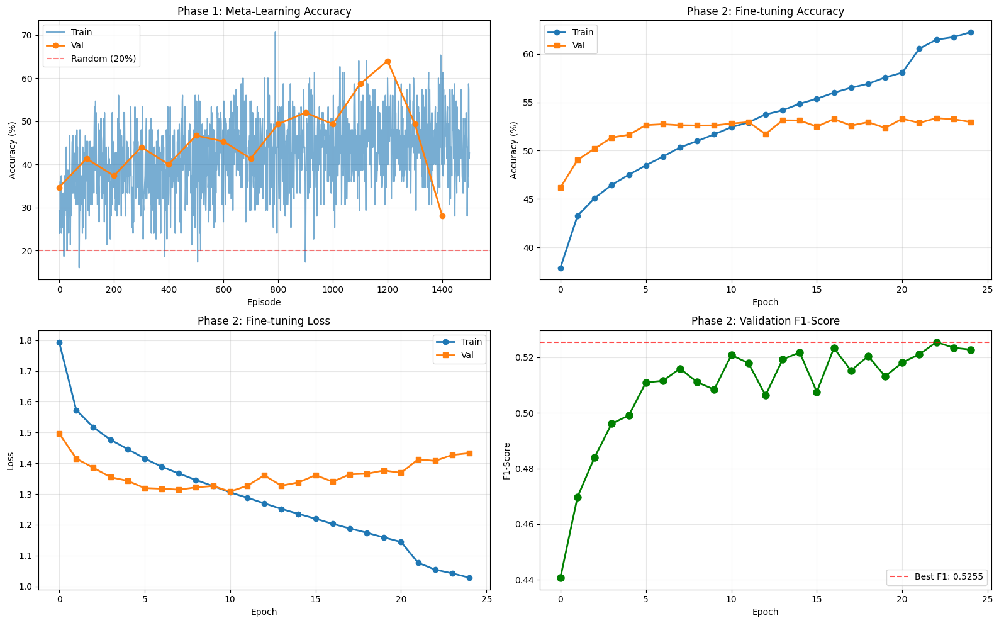

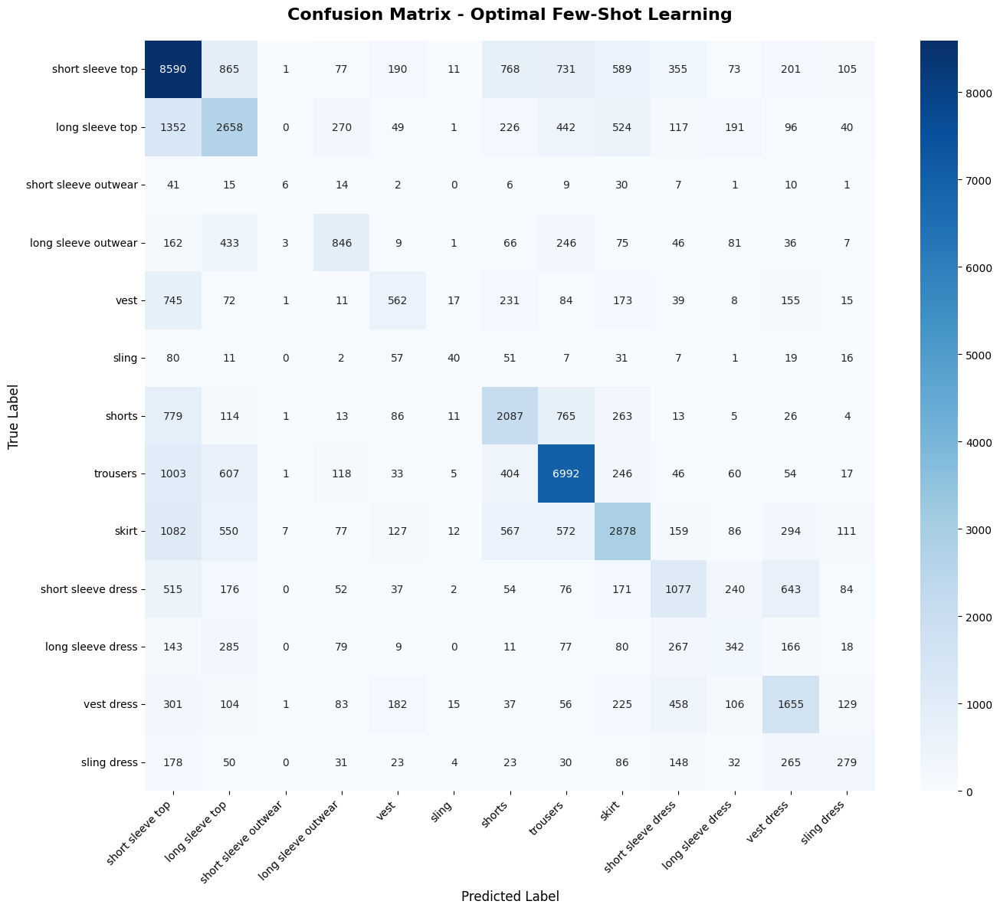

In [34]:
# Plot training curves
fig, axes = plt.subplots(2, 2, figsize=(16, 10))

# Meta-learning curves
axes[0, 0].plot([a*100 for a in train_accs], alpha=0.6, label='Train')
if val_accs:
    val_episodes = [i * EVAL_EVERY for i in range(len(val_accs))]
    axes[0, 0].plot(val_episodes, [a*100 for a in val_accs], 'o-', label='Val', linewidth=2)
axes[0, 0].axhline(y=20, color='r', linestyle='--', alpha=0.5, label='Random (20%)')
axes[0, 0].set_xlabel('Episode')
axes[0, 0].set_ylabel('Accuracy (%)')
axes[0, 0].set_title('Phase 1: Meta-Learning Accuracy')
axes[0, 0].legend()
axes[0, 0].grid(alpha=0.3)

# Fine-tuning accuracy
axes[0, 1].plot(history['train_acc'], 'o-', label='Train', linewidth=2)
axes[0, 1].plot(history['val_acc'], 's-', label='Val', linewidth=2)
axes[0, 1].set_xlabel('Epoch')
axes[0, 1].set_ylabel('Accuracy (%)')
axes[0, 1].set_title('Phase 2: Fine-tuning Accuracy')
axes[0, 1].legend()
axes[0, 1].grid(alpha=0.3)

# Fine-tuning loss
axes[1, 0].plot(history['train_loss'], 'o-', label='Train', linewidth=2)
axes[1, 0].plot(history['val_loss'], 's-', label='Val', linewidth=2)
axes[1, 0].set_xlabel('Epoch')
axes[1, 0].set_ylabel('Loss')
axes[1, 0].set_title('Phase 2: Fine-tuning Loss')
axes[1, 0].legend()
axes[1, 0].grid(alpha=0.3)

# F1 score progression
axes[1, 1].plot(history['val_f1'], 'o-', color='green', linewidth=2, markersize=8)
axes[1, 1].axhline(y=best_val_f1, color='r', linestyle='--', alpha=0.7, 
                   label=f'Best F1: {best_val_f1:.4f}')
axes[1, 1].set_xlabel('Epoch')
axes[1, 1].set_ylabel('F1-Score')
axes[1, 1].set_title('Phase 2: Validation F1-Score')
axes[1, 1].legend()
axes[1, 1].grid(alpha=0.3)

plt.tight_layout()
plt.savefig(os.path.join(RESULTS_DIR, 'optimal_fewshot_training_curves.png'), dpi=150)
plt.show()

# Confusion Matrix
cm = confusion_matrix(val_labels, val_preds)
plt.figure(figsize=(14, 12))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=[CATEGORY_NAMES[i] for i in range(13)],
            yticklabels=[CATEGORY_NAMES[i] for i in range(13)])
plt.title('Confusion Matrix - Optimal Few-Shot Learning', fontsize=16, fontweight='bold', pad=20)
plt.ylabel('True Label', fontsize=12)
plt.xlabel('Predicted Label', fontsize=12)
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=0)
plt.tight_layout()
plt.savefig(os.path.join(RESULTS_DIR, 'optimal_fewshot_confusion_matrix.png'), dpi=150)
plt.show()
